# Integrated Project

**Project description**

You work for the online store Ice, which sells video games all over the world. User and expert reviews, genres, platforms (e.g. Xbox or PlayStation), and historical data on game sales are available from open sources. You need to identify patterns that determine whether a game succeeds or not. This will allow you to spot potential big winners and plan advertising campaigns.
In front of you is data going back to 2016. Let’s imagine that it’s December 2016 and you’re planning a campaign for 2017. The dataset contains the abbreviation ESRB. The Entertainment Software Rating Board evaluates a game's content and assigns an age rating such as Teen or Mature.

## Data Preparation
**Initial Observations:**
- There are many missing critic and user scores, figure out what to do with them 
- Many missing ratings as well 
- Some missing years, can change data type though it's not essential

Features: 
- Create a total sales column
- Create an average user / critic score column
- Create separate grouped tables (by console, genre, rating) and aggregate there

Analysis: 
- Examine impact on sales from possible factors: platform, genre, scores, rating
- Examine regional differences (are some games a hit in specific regions?) 
- Determine the factors that impact sales 

In [1]:
# Import necessary modules
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import plotly.express as px
import seaborn as sns
import matplotlib.ticker as mtick
from scipy import stats as st

In [2]:
# Import the data
df = pd.read_csv('moved_games.csv')

In [3]:
# Changes:
#     lower-case columns
#     change user_score to float 
#     change year to datetime 

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16713 non-null  object 
 1   Platform         16715 non-null  object 
 2   Year_of_Release  16446 non-null  float64
 3   Genre            16713 non-null  object 
 4   NA_sales         16715 non-null  float64
 5   EU_sales         16715 non-null  float64
 6   JP_sales         16715 non-null  float64
 7   Other_sales      16715 non-null  float64
 8   Critic_Score     8137 non-null   float64
 9   User_Score       10014 non-null  object 
 10  Rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


In [4]:
df.describe()

,Year_of_Release,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score
count,16446.000000,16715.000000,16715.000000,16715.000000,16715.000000,8137.000000
mean,2006.484616,0.263377,0.145060,0.077617,0.047342,68.967679
std,5.877050,0.813604,0.503339,0.308853,0.186731,13.938165
min,1980.000000,0.000000,0.000000,0.000000,0.000000,13.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,60.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,71.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,79.000000
max,2016.000000,41.360000,28.960000,10.220000,10.570000,98.000000


In [5]:
df.head()

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,8,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,8,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN


In [6]:
# Changing columns to lower-case 
df.columns = df.columns.str.lower()
df.columns

Index(['name', 'platform', 'year_of_release', 'genre', 'na_sales', 'eu_sales',
       'jp_sales', 'other_sales', 'critic_score', 'user_score', 'rating'],
      dtype='object')

In [7]:
# Looks like there's a 'tbd' rating
df['user_score'].unique()

array(['8', nan, '8.3', '8.5', '6.6', '8.4', '8.6', '7.7', '6.3', '7.4',
       '8.2', '9', '7.9', '8.1', '8.7', '7.1', '3.4', '5.3', '4.8', '3.2',
       '8.9', '6.4', '7.8', '7.5', '2.6', '7.2', '9.2', '7', '7.3', '4.3',
       '7.6', '5.7', '5', '9.1', '6.5', 'tbd', '8.8', '6.9', '9.4', '6.8',
       '6.1', '6.7', '5.4', '4', '4.9', '4.5', '9.3', '6.2', '4.2', '6',
       '3.7', '4.1', '5.8', '5.6', '5.5', '4.4', '4.6', '5.9', '3.9',
       '3.1', '2.9', '5.2', '3.3', '4.7', '5.1', '3.5', '2.5', '1.9', '3',
       '2.7', '2.2', '2', '9.5', '2.1', '3.6', '2.8', '1.8', '3.8', '0',
       '1.6', '9.6', '2.4', '1.7', '1.1', '0.3', '1.5', '0.7', '1.2',
       '2.3', '0.5', '1.3', '0.2', '0.6', '1.4', '0.9', '1', '9.7'],
      dtype=object)

In [8]:
# No discernable pattern for tbds, will convert to nan
#     Only in games released after 1997 in this dataset, but as discovered later on most pre-1998 games don't have ratings 
#     Tend to be less successful games
df.query('user_score == "tbd"').describe()

,year_of_release,na_sales,eu_sales,jp_sales,other_sales,critic_score
count,2376.000000,2424.000000,2424.000000,2424.000000,2424.000000,1082.000000
mean,2007.450337,0.126052,0.043519,0.002727,0.015862,60.711645
std,3.484229,0.180586,0.111412,0.026136,0.039156,11.193035
min,1997.000000,0.000000,0.000000,0.000000,0.000000,23.000000
25%,2005.000000,0.030000,0.000000,0.000000,0.000000,54.000000
50%,2008.000000,0.075000,0.010000,0.000000,0.010000,62.000000
75%,2010.000000,0.150000,0.040000,0.000000,0.020000,69.000000
max,2016.000000,3.450000,2.590000,0.860000,1.090000,90.000000


In [9]:
# Checking what tbd looks like 
df.query('user_score == "tbd"').sort_values(by='na_sales', ascending=False).head()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
119,Zumba Fitness,Wii,2010.0,Sports,3.45,2.59,0.0,0.66,NaN,tbd,E
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,2.15,0.18,0.0,0.07,73.0,tbd,E
301,Namco Museum: 50th Anniversary,PS2,2005.0,Misc,2.08,1.35,0.0,0.54,61.0,tbd,E10+
881,Who wants to be a millionaire,PC,1999.0,Misc,1.94,0.00,0.0,0.00,NaN,tbd,E
645,uDraw Studio,Wii,2010.0,Misc,1.65,0.57,0.0,0.20,71.0,tbd,E


In [10]:
# Why are some year_of_release empty?
#     Some names have a year in the name, usually released prior to that year or in that year 
#     But out of 16,000+ games, only 269 are missing a year. Will keep it NaN for now 
#     Originally tried to fill it in with years in the name but realized there are games like Warzone2100, Battlefield 1942 that don't fit 

df.query('year_of_release.isna()').sort_values(by='na_sales', ascending=False).head()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,NaN,Sports,4.26,0.26,0.01,0.71,94.0,8.5,E
609,Space Invaders,2600,NaN,Shooter,2.36,0.14,0.00,0.03,NaN,NaN,NaN
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,2.15,0.18,0.00,0.07,73.0,tbd,E
627,Rock Band,X360,NaN,Misc,1.93,0.33,0.00,0.21,92.0,8.2,T
456,LEGO Batman: The Videogame,Wii,NaN,Action,1.80,0.97,0.00,0.29,74.0,7.9,E10+


In [11]:
df.query('year_of_release.isna()').describe()

,year_of_release,na_sales,eu_sales,jp_sales,other_sales,critic_score
count,0.0,269.000000,269.000000,269.000000,269.000000,154.000000
mean,NaN,0.219888,0.090929,0.024907,0.032007,67.584416
std,NaN,0.424907,0.207933,0.090160,0.075546,14.828740
min,NaN,0.000000,0.000000,0.000000,0.000000,22.000000
25%,NaN,0.010000,0.000000,0.000000,0.000000,57.000000
50%,NaN,0.090000,0.020000,0.000000,0.010000,70.000000
75%,NaN,0.240000,0.100000,0.000000,0.030000,78.000000
max,NaN,4.260000,2.360000,0.770000,0.710000,94.000000


**Changing column data types here**

In [12]:
# Change user_score to float
df['user_score'] = pd.to_numeric(df['user_score'], errors='coerce')
# sorted(df['user_score'].unique())

In [13]:
# Change year_of_release to YYYY
df['year_of_release'] = pd.to_datetime(df['year_of_release'], format='%Y').dt.year

**Changing individual values here**

In [14]:
# See Data Cleaning section below for details
#     Strongest Tokyo University Shogi DS date is wrong. Original on MYCOM? Was 1986, 
#     DS version is 2007? https://www.suruga-ya.com/en/product/176000588

df.loc[15957,'year_of_release'] = 2007

In [15]:
# Removing Wii sports since it comes bundled with the Wii and is an extreme outlier 

df = df.drop(df.query('name == "Wii Sports"').index)

**Creating new columns here**

In [16]:
# Create a total_sales column
df['total_sales'] = df['na_sales'] + df['eu_sales'] + df['jp_sales']

In [17]:
# Get user_score on the same scale as critic_score
# Create a combined score

df['user_score'] = df['user_score'] * 10
df['avg_score'] = (df['user_score'] + df['critic_score'])/2
df['delta_score'] = df['critic_score'] - df['user_score'] # Positive means critic > users 

In [18]:
# Turn ratings into numeric 

# E: Everyone, suitable for all ages --> 3
# M: Mature, intended for ages 17 and up --> 18
# T: Teen, suitable for ages 13 and up --> 13
# E10+: Everyone 10+, suitable for ages 10 and up --> 10
# K-A: Kids to Adults, suitable for all ages (renamed to E for Everyone in 1998) --> Group with E
# AO: Adults Only, intended for ages 18 and up --> Group with M
# EC: Early Childhood, suitable for ages 3 and up --> Group with E
# RP: Rating Pending, not yet assigned a final rating by the ESRB

df['rating'].unique()

array([nan, 'E', 'M', 'T', 'E10+', 'K-A', 'AO', 'EC', 'RP'], dtype=object)

In [19]:
rating_dict = {
    'E':1, # ~3+ 
    'M':5, # ~18+ 
    'T':4, # 13+ 
    'E10+':3, # 10+ 
    'K-A':1, # ~3+ 
    'AO':5, # ~18+
    'EC':1 # 3+
}

df['age_rating'] = np.nan
df['age_rating'] = df['rating'].map(rating_dict)
df['age_rating'].astype('float')

1        NaN
2        1.0
3        1.0
4        NaN
5        NaN
        ... 
16710    NaN
16711    NaN
16712    NaN
16713    NaN
16714    NaN
Name: age_rating, Length: 16714, dtype: float64

**Create masks, groups, and subset dataframes here**

In [20]:
# Create a table with:
#     Console
#     Min year with game released
#     Max year with game released
#     Total sales
#     Total games 

# Observations:
#     Looks like there's an error with DS (it was not released in 1985)
#     Should take PC out of any average calcualtions, since it's different than a platform console 
#     Also take out any console with max at 2016 since those are "present" at the time of this data 

years = df.groupby('platform')['year_of_release'].agg(['min','max','count'])
sales = df.groupby('platform')[['na_sales','eu_sales','jp_sales','total_sales']].sum()
table = pd.concat([years, sales], axis=1)
table['avg_sales'] = table['total_sales'] / table['count']
table['lifecycle'] = table['max'] - table['min']
table = table.sort_values(by=['total_sales'], ascending=False).reset_index()
table.head()

,platform,min,max,count,na_sales,eu_sales,jp_sales,total_sales,avg_sales,lifecycle
0,PS2,2000.0,2011.0,2127,583.84,339.29,139.20,1062.33,0.499450,11.0
1,X360,2005.0,2016.0,1232,602.47,270.76,12.43,885.66,0.718880,11.0
2,PS3,2006.0,2016.0,1306,393.49,330.29,80.19,803.97,0.615597,10.0
3,Wii,2006.0,2016.0,1285,455.54,233.25,65.56,754.35,0.587043,10.0
4,DS,2004.0,2013.0,2121,382.40,188.89,175.57,746.86,0.352126,9.0


In [21]:
# Create a table with total sales for each year_of_release
annual_totals = df.groupby('year_of_release')[['na_sales','eu_sales','jp_sales','total_sales']].sum()
annual_totals

,na_sales,eu_sales,jp_sales,total_sales
year_of_release,,,,
1980.0,10.59,0.67,0.00,11.26
1981.0,33.40,1.96,0.00,35.36
1982.0,26.92,1.65,0.00,28.57
1983.0,7.76,0.80,8.10,16.66
1984.0,33.28,2.10,14.27,49.65
1985.0,33.73,4.74,14.54,53.01
1986.0,12.50,2.84,19.81,35.15
1987.0,8.46,1.41,11.63,21.50
1988.0,23.87,6.59,15.76,46.22


In [22]:
top_platforms = ['PS2', 'X360', 'Wii', 'PS3', 'DS', 'PS'] 
top_df = df.query('platform in @top_platforms')

In [23]:
mid_platforms = ['GBA', 'PSP', 'XB', 'GB', 'NES', '3DS', 'N64', 'SNES', 'GC', 'XOne'] 
mid_df = df.query('platform in @mid_platforms')

In [24]:
post_2000 = table[table['min'] >= 2000]['platform'].tolist()
post_2000_df = df.query('platform in @post_2000')

In [25]:
old_platforms = table[table['max'] < 2016]['platform'].tolist()
old_df = df.query('platform in @old_platforms')

In [26]:
new_platforms = table[table['max'] >= 2016]['platform'].tolist()
new_df = df.query('platform in @new_platforms')

In [27]:
above_10m = df.query('total_sales > 10')

## Data Cleaning

In [28]:
# Strongest Tokyo University Shogi DS date is wrong. Original on MYCOM? Was 1986, 
# DS version is 2007? https://www.suruga-ya.com/en/product/176000588
# Change value above so that it's reflected in all the tables

df.query('platform == "DS"').sort_values(by=['year_of_release']).head()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,avg_score,delta_score,age_rating
691,WarioWare Touched!,DS,2004.0,Puzzle,0.51,0.45,1.21,0.13,NaN,NaN,NaN,2.17,NaN,NaN,NaN
13463,Cocoto Kart Racer,DS,2004.0,Racing,0.04,0.00,0.00,0.00,NaN,NaN,E,0.04,NaN,NaN,1.0
11517,Kenshuui Tendo Dokuta,DS,2004.0,Simulation,0.00,0.00,0.08,0.00,NaN,NaN,NaN,0.08,NaN,NaN,NaN
4421,The Urbz: Sims in the City (all regions sales),DS,2004.0,Simulation,0.40,0.01,0.02,0.00,NaN,NaN,NaN,0.43,NaN,NaN,NaN
7902,Daigasso! Band Brothers,DS,2004.0,Misc,0.00,0.00,0.19,0.00,NaN,NaN,NaN,0.19,NaN,NaN,NaN


**Exploring NaN user_score and critic_score**

In [29]:
# Exploring NaN user_score and critic_score
# Looks like the nulls generally overlap for user and critic score 

df.query('critic_score.isna()').info()

<class 'pandas.core.frame.DataFrame'>
Index: 8578 entries, 1 to 16714
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             8576 non-null   object 
 1   platform         8578 non-null   object 
 2   year_of_release  8463 non-null   float64
 3   genre            8576 non-null   object 
 4   na_sales         8578 non-null   float64
 5   eu_sales         8578 non-null   float64
 6   jp_sales         8578 non-null   float64
 7   other_sales      8578 non-null   float64
 8   critic_score     0 non-null      float64
 9   user_score       573 non-null    float64
 10  rating           1895 non-null   object 
 11  total_sales      8578 non-null   float64
 12  avg_score        0 non-null      float64
 13  delta_score      0 non-null      float64
 14  age_rating       1895 non-null   float64
dtypes: float64(11), object(4)
memory usage: 1.0+ MB


In [30]:
df.query('user_score.isna()').info()

<class 'pandas.core.frame.DataFrame'>
Index: 9125 entries, 1 to 16714
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             9123 non-null   object 
 1   platform         9125 non-null   object 
 2   year_of_release  8983 non-null   float64
 3   genre            9123 non-null   object 
 4   na_sales         9125 non-null   float64
 5   eu_sales         9125 non-null   float64
 6   jp_sales         9125 non-null   float64
 7   other_sales      9125 non-null   float64
 8   critic_score     1120 non-null   float64
 9   user_score       0 non-null      float64
 10  rating           2445 non-null   object 
 11  total_sales      9125 non-null   float64
 12  avg_score        0 non-null      float64
 13  delta_score      0 non-null      float64
 14  age_rating       2444 non-null   float64
dtypes: float64(11), object(4)
memory usage: 1.1+ MB


In [31]:
df.query('critic_score.isna()').describe()

,year_of_release,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,total_sales,avg_score,delta_score,age_rating
count,8463.000000,8578.000000,8578.000000,8578.000000,8578.000000,0.0,573.000000,8578.000000,0.0,0.0,1895.000000
mean,2005.819213,0.178381,0.085059,0.099045,0.023539,NaN,64.223386,0.362485,NaN,NaN,1.995778
std,7.042594,0.716068,0.321036,0.343936,0.088740,NaN,19.593215,1.168347,NaN,NaN,1.358995
min,1980.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,1.000000
25%,2001.000000,0.000000,0.000000,0.000000,0.000000,NaN,53.000000,0.040000,NaN,NaN,1.000000
50%,2008.000000,0.020000,0.000000,0.000000,0.000000,NaN,70.000000,0.110000,NaN,NaN,1.000000
75%,2011.000000,0.140000,0.050000,0.060000,0.020000,NaN,79.000000,0.300000,NaN,NaN,3.000000
max,2016.000000,29.080000,10.950000,10.220000,2.740000,NaN,97.000000,39.470000,NaN,NaN,5.000000


In [32]:
df.query('user_score.isna()').describe()

,year_of_release,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,total_sales,avg_score,delta_score,age_rating
count,8983.000000,9125.000000,9125.000000,9125.000000,9125.000000,1120.000000,0.0,9125.000000,0.0,0.0,2444.000000
mean,2005.488256,0.169853,0.078655,0.093026,0.020686,60.934821,NaN,0.341534,NaN,NaN,1.873159
std,6.757205,0.692992,0.306731,0.334346,0.081948,11.383565,NaN,1.131553,NaN,NaN,1.273920
min,1980.000000,0.000000,0.000000,0.000000,0.000000,23.000000,NaN,0.000000,NaN,NaN,1.000000
25%,2001.000000,0.000000,0.000000,0.000000,0.000000,54.000000,NaN,0.040000,NaN,NaN,1.000000
50%,2007.000000,0.030000,0.000000,0.000000,0.000000,62.000000,NaN,0.100000,NaN,NaN,1.000000
75%,2010.000000,0.130000,0.050000,0.060000,0.010000,69.000000,NaN,0.270000,NaN,NaN,3.000000
max,2016.000000,29.080000,10.950000,10.220000,2.740000,90.000000,NaN,39.470000,NaN,NaN,5.000000


In [33]:
df.query('user_score.isna() or critic_score.isna()').sort_values(by='total_sales', ascending=False).head(60)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,avg_score,delta_score,age_rating
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,39.47,NaN,NaN,NaN
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,30.38,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN,29.68,NaN,NaN,NaN
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN,27.84,NaN,NaN,NaN
12,Pokemon Gold/Pokemon Silver,GB,1999.0,Role-Playing,9.00,6.18,7.20,0.71,NaN,NaN,NaN,22.38,NaN,NaN,NaN
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,21.93,NaN,NaN,NaN
18,Super Mario World,SNES,1990.0,Platform,12.78,3.75,3.54,0.55,NaN,NaN,NaN,20.07,NaN,NaN,NaN
21,Super Mario Land,GB,1989.0,Platform,10.83,2.71,4.18,0.42,NaN,NaN,NaN,17.72,NaN,NaN,NaN
20,Pokemon Diamond/Pokemon Pearl,DS,2006.0,Role-Playing,6.38,4.46,6.04,1.36,NaN,NaN,NaN,16.88,NaN,NaN,NaN
22,Super Mario Bros. 3,NES,1988.0,Platform,9.54,3.44,3.84,0.46,NaN,NaN,NaN,16.82,NaN,NaN,NaN


In [34]:
# Certain consoles, mostly older and less popular (pre-1998 with the exception of PS1) have no reviews at all 
# Most of these are taken out in our slimmed down data set (post-2000 + top + mid games)

reviews = df.groupby('platform')[['critic_score','user_score']].count()
count = df.groupby('platform')['name'].count()
release = df.groupby('platform')['year_of_release'].min()

pd.concat([reviews, count, release], axis=1).sort_values(by='critic_score')

,critic_score,user_score,name,year_of_release
platform,,,,
2600,0,0,133,1980.0
SCD,0,0,6,1993.0
PCFX,0,0,1,1996.0
SNES,0,0,239,1990.0
NG,0,0,12,1993.0
NES,0,0,98,1983.0
N64,0,0,319,1996.0
GG,0,0,1,1992.0
GEN,0,0,27,1990.0


<Axes: >

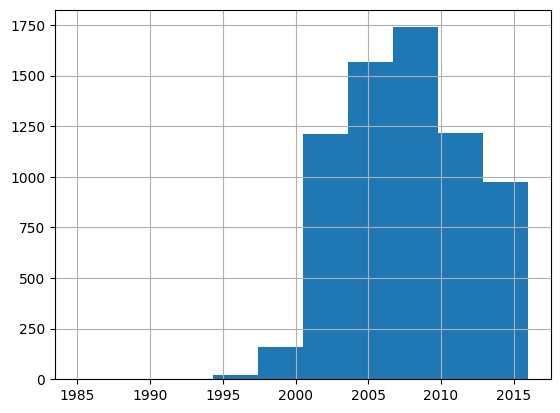

In [35]:
df.query('user_score.notna() and critic_score.notna()')['year_of_release'].hist()

<Axes: >

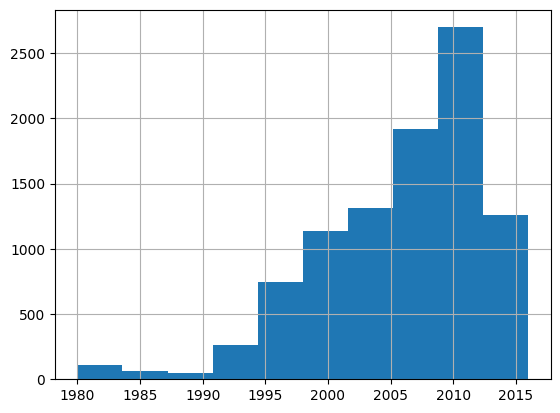

In [36]:
df.query('user_score.isna() or critic_score.isna()')['year_of_release'].hist()

In [37]:
cut_data = df.query('platform in @post_2000 and (platform in @top_platforms or platform in @mid_platforms)')

reviews = cut_data.groupby('platform')[['critic_score','user_score']].count()
count = cut_data.groupby('platform')['name'].count()
release = cut_data.groupby('platform')['year_of_release'].min()

pd.concat([reviews, count, release], axis=1).sort_values(by='critic_score')

,critic_score,user_score,name,year_of_release
platform,,,,
3DS,168,174,520,2011.0
XOne,169,182,247,2013.0
GBA,438,255,822,2000.0
GC,448,366,556,2001.0
PSP,462,421,1209,2004.0
Wii,584,559,1319,2006.0
DS,717,516,2151,2004.0
XB,725,586,824,2000.0
PS3,820,877,1331,2006.0


In [38]:
cut_data_missing_scores = df.query('platform in @post_2000 and (platform in @top_platforms or platform in @mid_platforms) and (critic_score.isna() or user_score.isna())')
cut_data_missing_scores.sort_values(by='total_sales', ascending=False).head(20)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,avg_score,delta_score,age_rating
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,21.93,NaN,NaN,NaN
20,Pokemon Diamond/Pokemon Pearl,DS,2006.0,Role-Playing,6.38,4.46,6.04,1.36,NaN,NaN,NaN,16.88,NaN,NaN,NaN
25,Pokemon Ruby/Pokemon Sapphire,GBA,2002.0,Role-Playing,6.06,3.90,5.38,0.50,NaN,NaN,NaN,15.34,NaN,NaN,NaN
27,Pokemon Black/Pokemon White,DS,2010.0,Role-Playing,5.51,3.17,5.65,0.80,NaN,NaN,NaN,14.33,NaN,NaN,NaN
33,Pokemon X/Pokemon Y,3DS,2013.0,Role-Playing,5.28,4.19,4.35,0.78,NaN,NaN,NaN,13.82,NaN,NaN,NaN
46,Pokemon HeartGold/Pokemon SoulSilver,DS,2009.0,Action,4.34,2.71,3.96,0.76,NaN,NaN,NaN,11.01,NaN,NaN,NaN
47,Pokemon Omega Ruby/Pokemon Alpha Sapphire,3DS,2014.0,Role-Playing,4.35,3.49,3.10,0.74,NaN,NaN,NaN,10.94,NaN,NaN,NaN
58,Pokemon FireRed/Pokemon LeafGreen,GBA,2004.0,Role-Playing,4.34,2.65,3.15,0.35,NaN,NaN,NaN,10.14,NaN,NaN,NaN
59,Super Mario 64,DS,2004.0,Platform,5.01,3.07,1.25,0.97,NaN,NaN,NaN,9.33,NaN,NaN,NaN
72,Minecraft,X360,2013.0,Misc,5.70,2.65,0.02,0.81,NaN,NaN,NaN,8.37,NaN,NaN,NaN


In [39]:
# Possible fill in with average of console and genre. Let's see how it looks in EDA first




## EDA
- Look at how many games were released in different years. Is the data for every period significant?
- Look at how sales varied from platform to platform. 
    - Choose the platforms with the greatest total sales and build a distribution based on data for each year. 
    - Find platforms that used to be popular but now have zero sales. How long does it generally take for new platforms to appear and old ones to fade?
- Determine what period you should take data for. To do so, look at your answers to the previous questions. The data should allow you to build a prognosis for 2017.
- Work only with the data that you've decided is relevant. Disregard the data for previous years.
    - Which platforms are leading in sales? Which ones are growing or shrinking? Select several potentially profitable platforms.
    - Build a box plot for the global sales of all games, broken down by platform. Are the differences in sales significant? What about average sales on various platforms? Describe your findings.
    - Take a look at how user and professional reviews affect sales for one popular platform (you choose). Build a scatter plot and calculate the correlation between reviews and sales. Draw conclusions.
- Keeping your conclusions in mind, compare the sales of the same games on other platforms.
- Take a look at the general distribution of games by genre. What can we say about the most profitable genres? Can you generalize about genres with high and low sales?

**Check individual games here**

In [40]:
df.dropna(subset=['name']).query('name.str.contains("Battlefield")')

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,avg_score,delta_score,age_rating
101,Battlefield 3,X360,2011.0,Shooter,4.46,2.11,0.06,0.69,84.0,74.0,M,6.63,79.0,10.0,5.0
104,Battlefield 3,PS3,2011.0,Shooter,2.85,2.89,0.35,1.08,85.0,75.0,M,6.09,80.0,10.0,5.0
289,Battlefield 1,PS4,2016.0,Shooter,1.10,2.15,0.21,0.61,88.0,84.0,M,3.46,86.0,4.0,5.0
357,Battlefield 4,PS4,2013.0,Shooter,1.35,1.55,0.17,0.51,85.0,69.0,M,3.07,77.0,16.0,5.0
378,Battlefield 4,PS3,2013.0,Shooter,1.30,1.42,0.27,0.50,80.0,58.0,M,2.99,69.0,22.0,5.0
380,Battlefield 4,X360,2013.0,Shooter,2.15,1.01,0.02,0.31,79.0,56.0,M,3.18,67.5,23.0,5.0
381,Battlefield: Bad Company 2,X360,2010.0,Shooter,2.10,1.01,0.04,0.32,88.0,86.0,M,3.15,87.0,2.0,5.0
485,Battlefield: Bad Company 2,PS3,2010.0,Shooter,1.33,1.10,0.08,0.44,88.0,85.0,M,2.51,86.5,3.0,5.0
538,Battlefield 3,PC,2011.0,Shooter,0.89,1.43,0.00,0.46,89.0,75.0,M,2.32,82.0,14.0,5.0
709,Battlefield 1,XOne,2016.0,Shooter,1.28,0.77,0.00,0.20,87.0,82.0,M,2.05,84.5,5.0,5.0


**Analyzing all-time sales trends**

<Axes: xlabel='platform'>

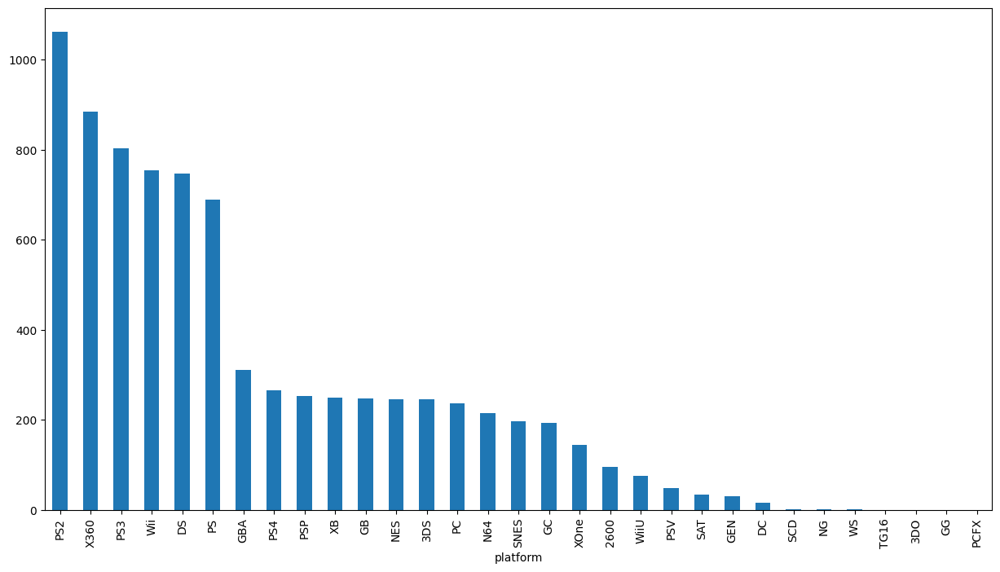

In [41]:
# All-time number of games released
# Segmenting consoles: 
#     These platforms have way more sales: PS2, X360, Wii, PS3, DS, PS
#     Middle tier consoles: GBA, PSP, XB, GB, NES, 3DS, N64, SNES, GC, XOne (excl PS4 because it was recently launched, and PC)

total_sales_table = df.groupby('platform')['total_sales'].sum().sort_values(ascending=False)
total_sales_table.plot(kind='bar', figsize=[15,8])

<Axes: xlabel='year_of_release'>

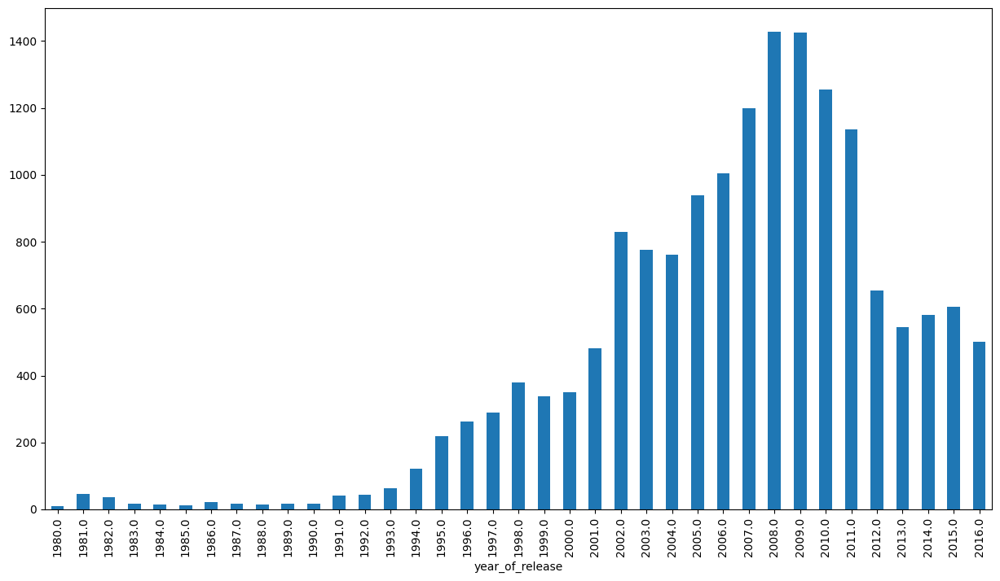

In [42]:
# Video games took off in the 90's, 2000-2010 had the largest issuance, which declined in the 10's

df['year_of_release'].value_counts().sort_index().plot(kind='bar', figsize=[15,8])

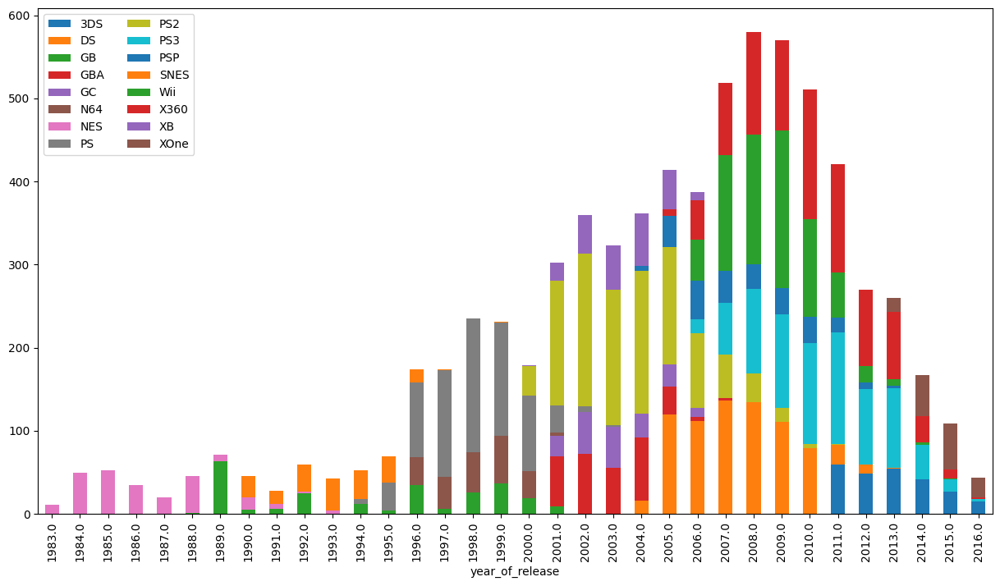

In [43]:
# Breaking it down by platform, only including top and middle tier games (too much noise with all consoles)

top_mid_df = df.query('platform in @top_platforms or platform in @mid_platforms') 

platform_time_series = top_mid_df.groupby(['platform','year_of_release'])['total_sales'].sum()
ax = platform_time_series.unstack(level='platform').plot(kind='bar',figsize=[15,8],stacked=True)
ax.legend(loc='upper left',ncol=2)

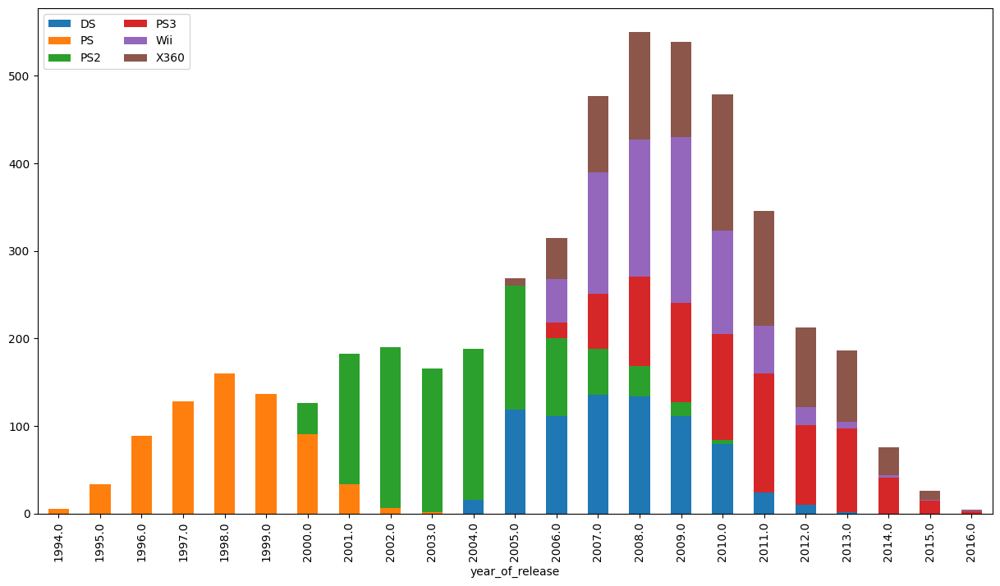

In [44]:
# Looking at just the top
platform_time_series = top_df.groupby(['platform','year_of_release'])['total_sales'].sum()
ax = platform_time_series.unstack(level='platform').plot(kind='bar',figsize=[15,8], stacked=True)
ax.legend(loc='upper left',ncol=2)

<Axes: xlabel='year_of_release'>

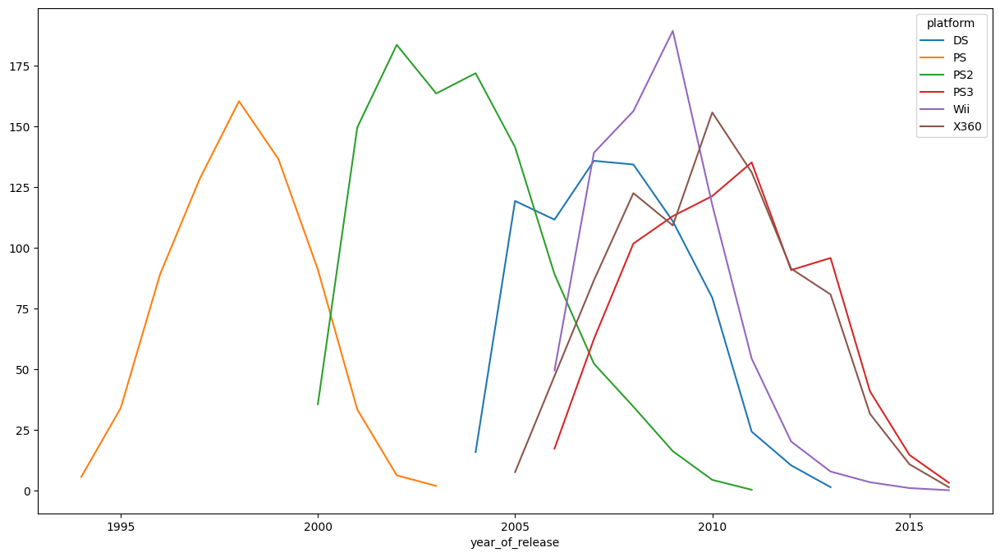

In [45]:
# Visualizing it a different way: 
#     Looks like most successful consoles have around 5 years duration 
#     PC is different since it has many iterations plus other uses 
#     Hard to see clearly in this chart, create tables below with precise values 

# platform_time_series.unstack(level='year_of_release').T.plot(kind='line',figsize=[15,8])
platform_time_series.unstack(level='platform').plot(kind='line',figsize=[15,8])

**Looking at platforms that have completed their lifecycles**

In [46]:
# Create a list of defunct platforms

defunct = table[
    (table['max'] < 2016) 
][['platform','lifecycle']]

print('Average Lifecycle: ', defunct['lifecycle'].mean())
defunct

Average Lifecycle:  6.136363636363637


,platform,lifecycle
0,PS2,11.0
4,DS,9.0
5,PS,9.0
6,GBA,7.0
8,PSP,11.0
9,XB,8.0
10,GB,13.0
11,NES,11.0
14,N64,6.0
15,SNES,9.0


In [47]:
# Create a list of defunct platforms - top platforms
# Average lifecycle is close to 10 years

top_defunct = table[
    (table['max'] < 2016) 
    & (table['platform'].isin(top_platforms))
][['platform','lifecycle']]

print('Average Lifecycle: ', top_defunct['lifecycle'].mean())
top_defunct

Average Lifecycle:  9.666666666666666


,platform,lifecycle
0,PS2,11.0
4,DS,9.0
5,PS,9.0


In [48]:
# Create a list of defunct platforms - middle platforms
# Average lifecycle is close to 9 years

mid_defunct = table[
    (table['max'] < 2016) 
    & (table['platform'].isin(mid_platforms))
][['platform','lifecycle']]

print('Average Lifecycle: ', mid_defunct['lifecycle'].mean())
mid_defunct

Average Lifecycle:  8.875


,platform,lifecycle
6,GBA,7.0
8,PSP,11.0
9,XB,8.0
10,GB,13.0
11,NES,11.0
14,N64,6.0
15,SNES,9.0
16,GC,6.0


In [49]:
# The average defunct console has a 6 year lifecycle, and the best performing one had 13

table.query('platform != "PC" and max != 2016').describe()

,min,max,count,na_sales,eu_sales,jp_sales,total_sales,avg_sales,lifecycle
count,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
mean,1994.727273,2000.863636,451.727273,112.678636,51.207273,44.698182,208.584091,0.565643,6.136364
std,6.119304,7.291844,661.610530,151.416222,86.990086,56.592672,283.048350,0.691825,4.189505
min,1980.000000,1989.000000,1.000000,0.000000,0.000000,0.000000,0.030000,0.030000,0.000000
25%,1992.250000,1995.000000,7.500000,0.180000,0.090000,0.682500,1.532500,0.198258,2.250000
50%,1994.500000,2000.000000,107.000000,75.915000,12.545000,15.070000,144.910000,0.331119,6.500000
75%,1999.750000,2007.000000,737.750000,137.630000,57.667500,83.035000,248.580000,0.653571,9.000000
max,2004.000000,2015.000000,2127.000000,583.840000,339.290000,175.570000,1062.330000,2.549072,13.000000


**Looking at distribution of sales**

In [50]:
# Average lifecycle of middle-top consoles is 9-10 years, and max lifecycle for a successful console (GB) is 13
#     We can take data from 2000 onwards and disregard all platforms released before then 
#     We can also disregard consoles not in the top_platforms or middle_platforms 
# We can look at all games with total_sales over $10 million 

# Build a box plot for the global sales of all games, broken down by platform. 
# Are the differences in sales significant? What about average sales on various platforms? Describe your findings.

# Looks like game sales have a heavy right skew, most will not sell much with a select few creating most of the sales

fig = px.box(top_mid_df.query('platform in @post_2000'),
             x='platform',
             y='total_sales',
             hover_data='name',
             notched=True
            )
fig.show()

In [51]:
# Box plots don't tell much since there's so much right tail skew, can't see the averages 

fig = px.box(top_mid_df.query('platform in @post_2000'),
             x='genre',
             y='total_sales',
             hover_data='name',
             notched=True
            )
fig.show()

<Axes: ylabel='Frequency'>

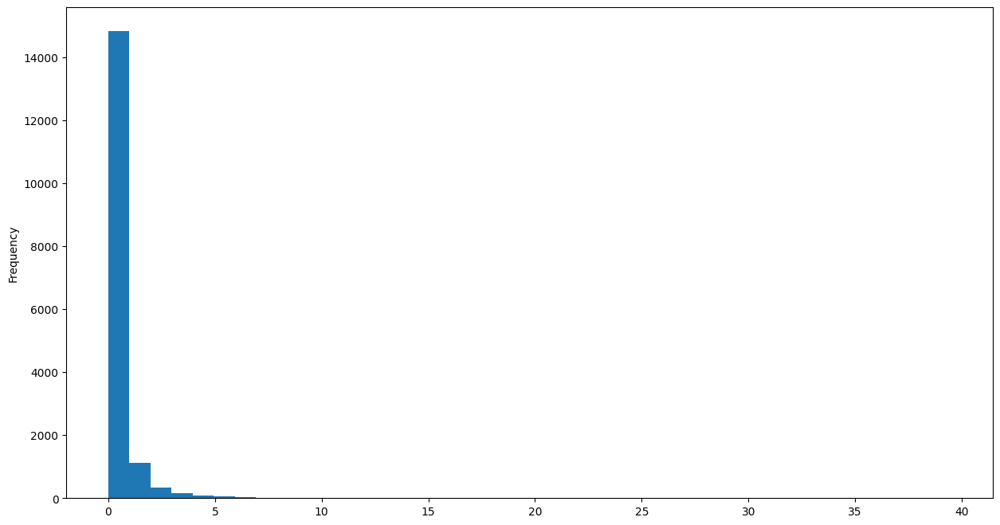

In [52]:
df['total_sales'].plot(kind='hist', bins=40, figsize=[15,8])

<Axes: xlabel='genre'>

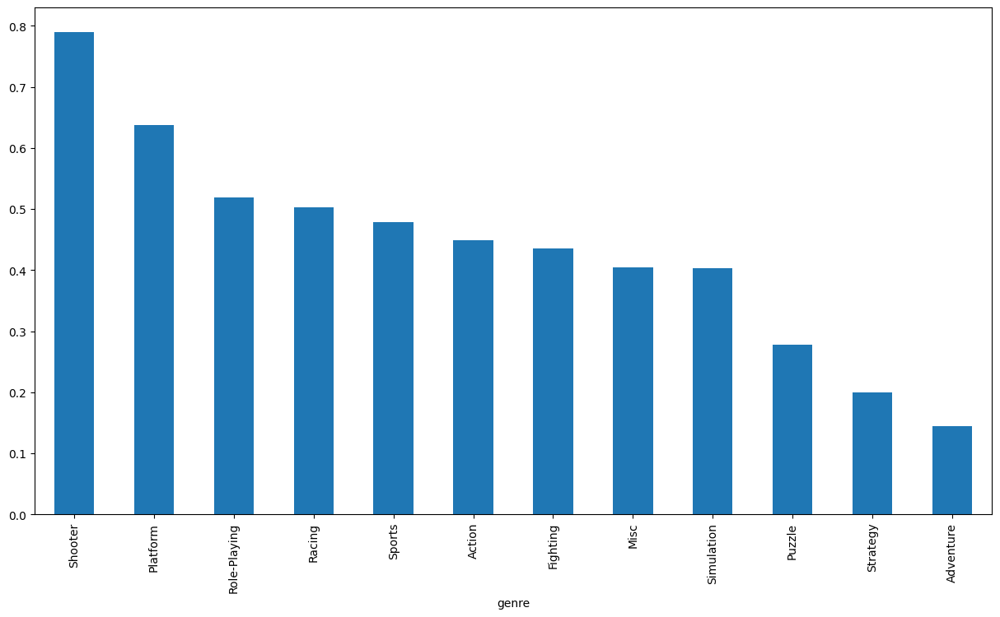

In [53]:
genre_sales = post_2000_df.groupby('genre')['total_sales'].mean().sort_values(ascending=False)
genre_sales.plot(kind='bar', figsize=[15,8])

<Axes: xlabel='platform'>

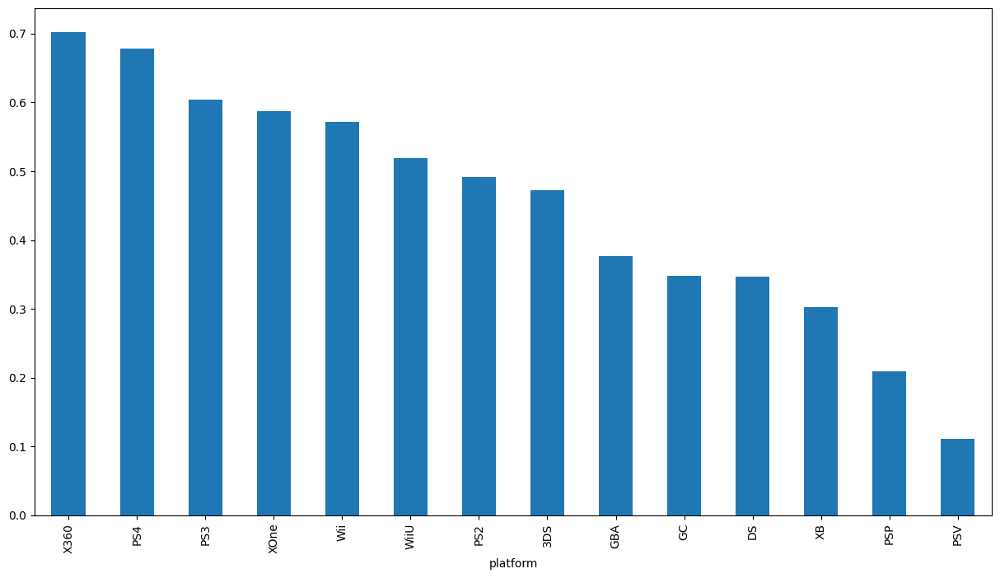

In [54]:
platform_sales = post_2000_df.groupby('platform')['total_sales'].mean().sort_values(ascending=False)
platform_sales.plot(kind='bar', figsize=[15,8])

<Axes: xlabel='rating'>

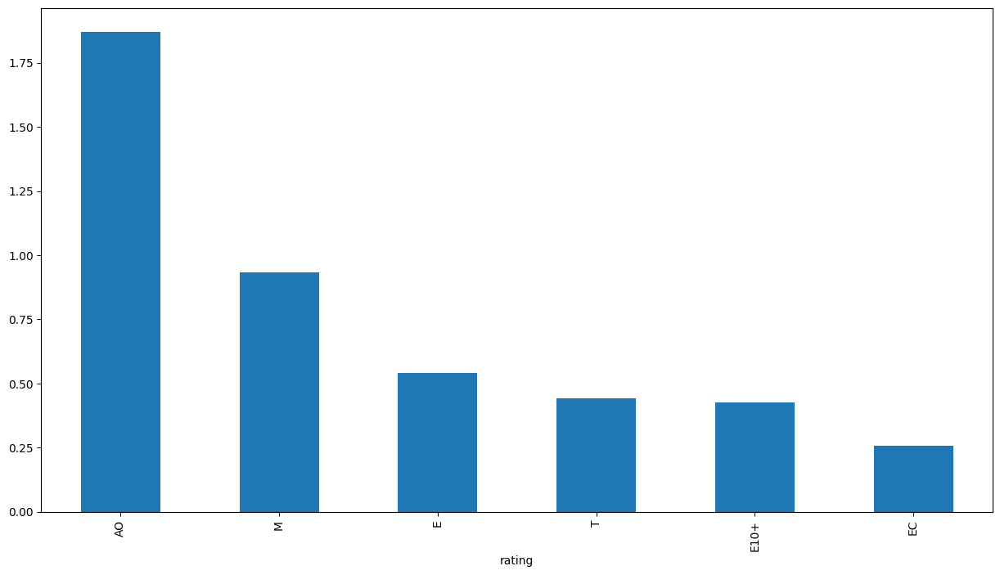

In [55]:
# Seems like more mature games have higher sales? 
rating_sales = post_2000_df.groupby('rating')['total_sales'].mean().sort_values(ascending=False)
rating_sales.plot(kind='bar', figsize=[15,8])

**Looking at user/critic score impact**

In [56]:
# Looking at average rating by all platforms

post_2000_df.groupby('platform')[['critic_score', 'user_score']].agg(['mean', 'count']).sort_values(by=('critic_score','mean'), ascending=False)

critic_score       user_score      
                 mean count       mean count
platform                                    
XOne        73.325444   169  65.214286   182
PS4         72.091270   252  67.482490   257
PSV         70.791667   120  73.363636   143
WiiU        70.733333    90  69.040000   100
PS3         70.382927   820  67.265678   877
XB          69.859310   725  75.005119   586
GC          69.488839   448  75.975410   366
PS2         68.727273  1298  76.268332  1241
X360        68.616812   916  66.835404   966
PSP         67.424242   462  72.282660   421
GBA         67.372146   438  76.768627   255
3DS         67.101190   168  68.316092   174
DS          63.761506   717  70.251938   516
Wii         62.801370   584  67.404293   559

In [57]:
# Looking at average rating by genre

post_2000_df.groupby('genre')[['critic_score', 'user_score']].agg(['mean', 'count']).sort_values(by=('critic_score','mean'), ascending=False)

critic_score       user_score      
                     mean count       mean count
genre                                           
Sports          71.628444  1125  69.822519  1048
Role-Playing    71.254428   621  76.028986   621
Strategy        69.775148   169  72.722222   162
Shooter         69.125628   796  70.401809   774
Fighting        69.069767   387  72.978723   376
Platform        67.600000   470  72.596010   401
Racing          67.158850   661  70.246046   569
Puzzle          67.041284   218  71.260504   119
Simulation      66.708812   261  72.254167   240
Misc            66.470703   512  68.021028   428
Action          65.988338  1715  70.468807  1651
Adventure       64.444853   272  70.610236   254

In [58]:
# Looking at average score by genre and platform
pd.pivot_table(post_2000_df, 
               values='avg_score', 
               index='platform',
               columns='genre', 
               aggfunc=np.mean
              ).sort_values(by=['Shooter'], ascending=False)

genre,Action,Adventure,Fighting,Misc,Platform,Puzzle,Racing,Role-Playing,Shooter,Simulation,Sports,Strategy
platform,,,,,,,,,,,,
PSV,70.081081,74.650000,73.222222,78.500000,76.750000,71.500000,64.200000,74.390625,73.500000,NaN,73.833333,NaN
PSP,68.519737,68.076923,70.366667,68.023810,73.175000,70.000000,73.410256,71.442857,73.066667,69.375000,71.442623,67.035714
XB,70.299180,71.750000,69.333333,67.166667,73.576923,37.000000,70.723684,78.411765,72.372807,73.809524,79.852000,76.230769
GC,72.398551,67.807692,73.041667,68.470588,70.000000,71.833333,71.318182,76.978261,72.325000,79.500000,78.728571,79.285714
3DS,64.589286,69.500000,68.857143,70.450000,71.888889,69.250000,62.600000,74.423077,72.000000,69.944444,67.500000,66.500000
PS2,71.793878,66.850000,74.878378,70.675439,70.978873,73.666667,72.274436,74.904167,71.792969,76.467391,76.027228,73.564103
XOne,69.186275,79.800000,63.500000,71.625000,65.125000,NaN,71.535714,78.000000,71.758065,58.000000,63.596774,72.500000
PS4,70.726190,75.642857,72.272727,65.875000,65.727273,86.000000,69.800000,74.166667,70.985294,75.750000,63.304878,66.375000
DS,62.831169,66.193548,66.678571,65.855263,73.514286,71.105769,64.184211,73.056180,70.462963,64.689189,70.522727,70.392857


**Create scatterplots to examine correlations**

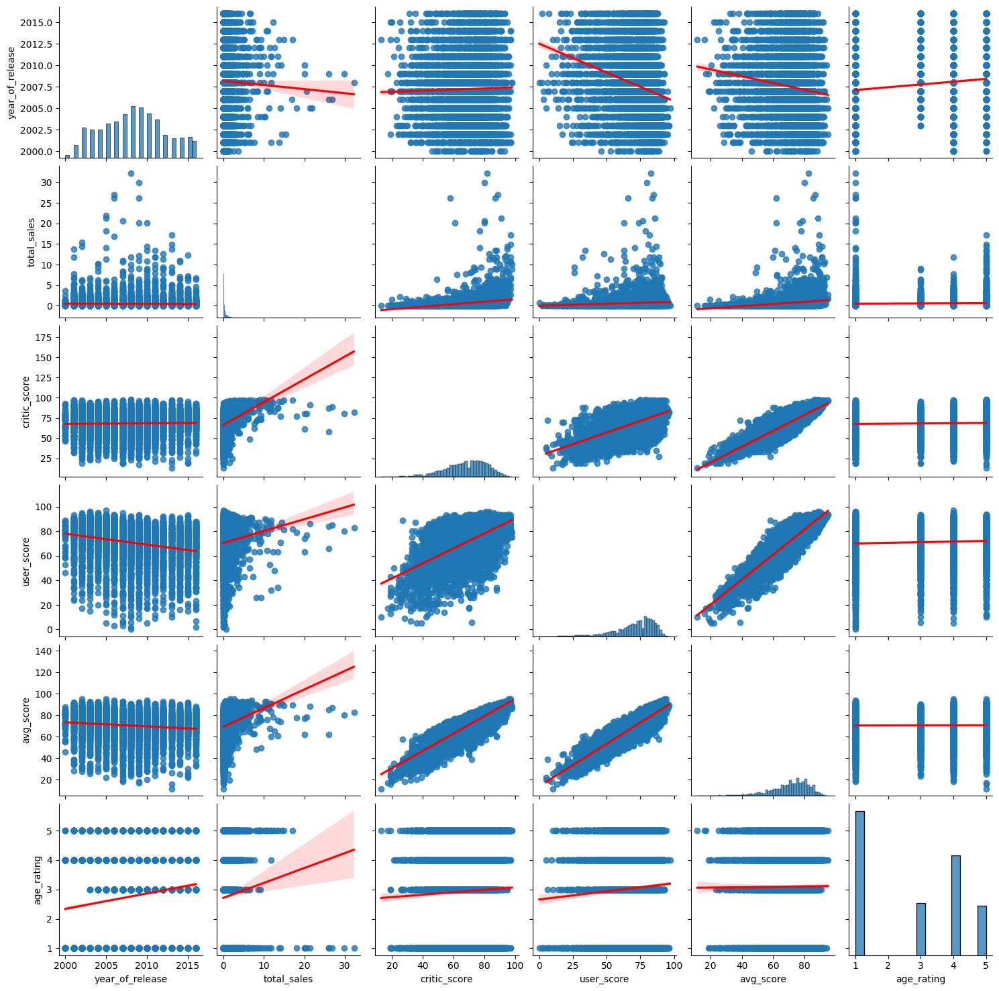

In [59]:
# Plotting the aggregate numeric columns to look for relationships 
#     Interestingly critic_score shows positive relationships with total_sales but user_score doesn't

sns.pairplot(post_2000_df[['year_of_release','total_sales','critic_score','user_score','avg_score','age_rating']], 
             kind='reg',
             plot_kws={'line_kws':{'color':'red'}}
            )

plt.show()

In [60]:
# Getting the precise correlation between these variables
#     Raw dataset doesn't show strong correlations between score and sales 
#     However there's a lot of NaNs, so let's drop those - still not a strong correlation 
#     Let's only look at games in the post_2000 console group - correlations are still roughly the same 
# No relation between year of release and sales 
# User scores tend to get worse over time
# some correlation between critic score and total sales
# very small correlation between user score and total sales 
# decent correlation between user and critic scores 
# not much correlation with age_rating, explored this b/c M/AO category had a lot of sales  

# Note: Post-2000_df and df have same results because games pre-2000 don't really have reviews 

# Critic score is the only one that has a sizeable correlation with sales, perhaps it's different by region? 
# Also not sure about the impact of nans 
# Let's explore the differences between user and critic scores, and look at games where they diverge

post_2000_df[['year_of_release','total_sales','critic_score','user_score','avg_score','age_rating']].dropna(how='any').corr()

,year_of_release,total_sales,critic_score,user_score,avg_score,age_rating
year_of_release,1.000000,0.040545,0.008710,-0.225856,-0.123565,0.159068
total_sales,0.040545,1.000000,0.285372,0.096119,0.212335,-0.018590
critic_score,0.008710,0.285372,1.000000,0.591404,0.888772,-0.011238
user_score,-0.225856,0.096119,0.591404,1.000000,0.895224,0.029714
avg_score,-0.123565,0.212335,0.888772,0.895224,1.000000,0.010679
age_rating,0.159068,-0.018590,-0.011238,0.029714,0.010679,1.000000


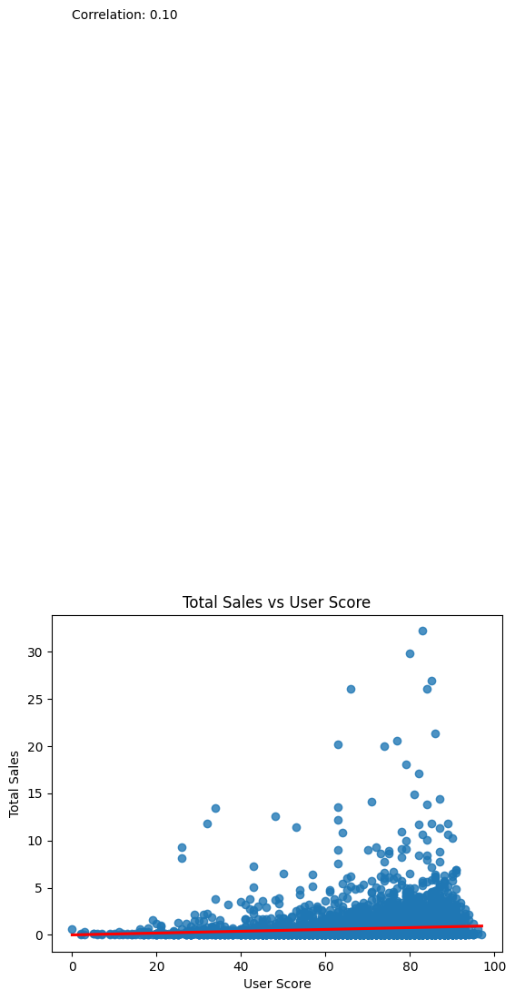

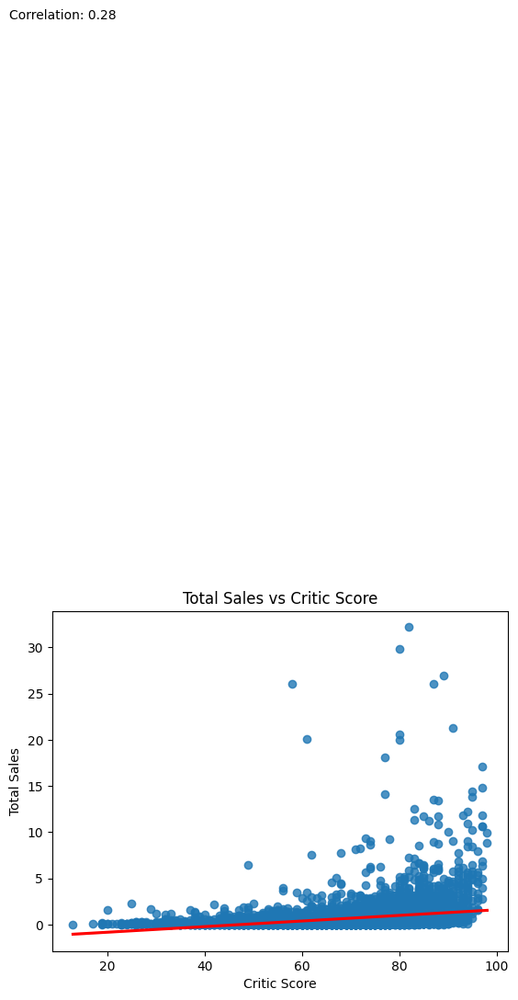

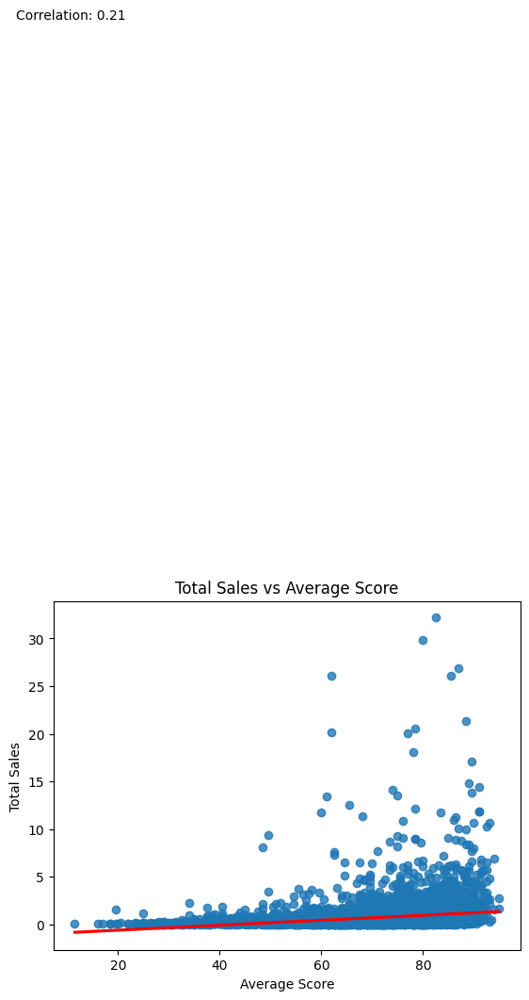

In [61]:
# Look at scatterplot of user_score and critic_score relative to sales, without filling in NaNs first 
# Can also average critic_score and user_score to get a combined score 

scores = ['user_score', 'critic_score', 'avg_score']
score_dict = {
    'user_score':'User Score', 
    'critic_score':'Critic Score', 
    'avg_score':'Average Score'
}

for score in scores:
    sns.regplot(x=score, y='total_sales', data=post_2000_df, line_kws={'color': 'red'}),
    plt.title('Total Sales vs {}'.format(score_dict[score])),
    plt.xlabel('{}'.format(score_dict[score])),
    plt.ylabel('Total Sales'),
    corr = df['total_sales'].corr(df[score])
    plt.text(df['total_sales'].min(), df[score].max(), f"Correlation: {corr:.2f}", fontsize=10)
    plt.show()

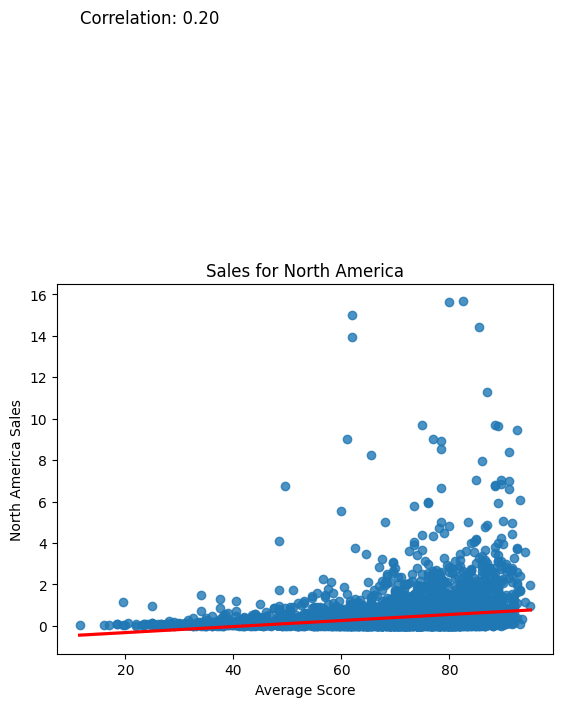

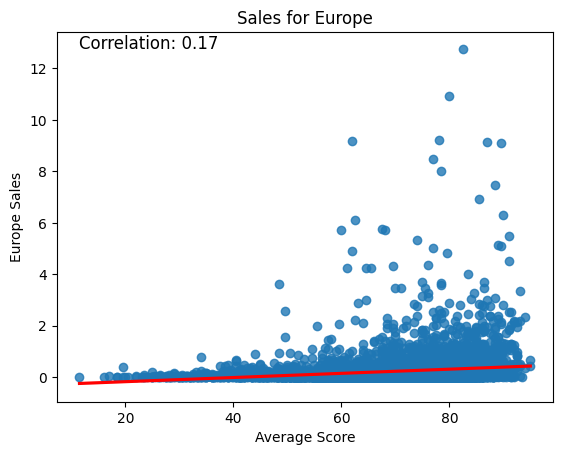

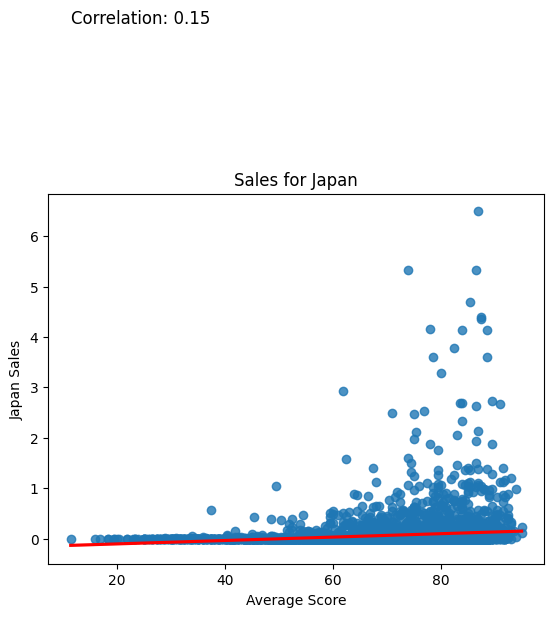

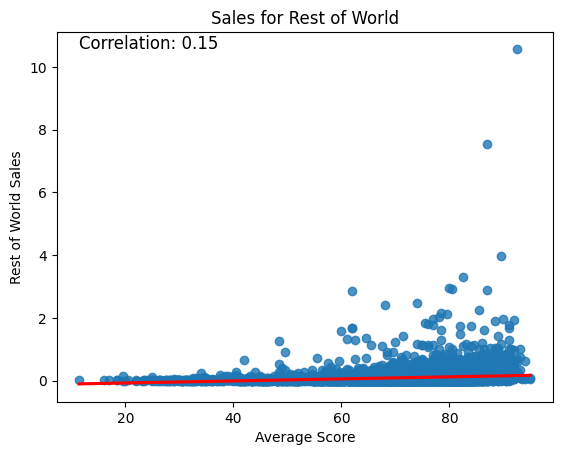

In [62]:
# Use a loop to create scatters for each region 

regions = ['na_sales', 'eu_sales', 'jp_sales', 'other_sales']
region_dict = {
    'na_sales':'North America',
    'eu_sales':'Europe',
    'jp_sales':'Japan',
    'other_sales':'Rest of World'
}

for region in regions:
    sns.regplot(x='avg_score', y=region, data=post_2000_df, line_kws={'color': 'red'}),
    plt.title('Sales for {}'.format(region_dict[region])),
    plt.xlabel('Average Score'),
    plt.ylabel('{} Sales'.format(region_dict[region])),
    corr = df['avg_score'].corr(df[region])
    plt.text(df['avg_score'].min(), df[region].max(), f"Correlation: {corr:.2f}", fontsize=12)
    plt.show()

**Examining difference between user_score and critic_score**

Let's explore the differences between user and critic scores, and look at games where they diverge
- Compare: games with the most positive and most negative delta_scores, and the total_sales 
- Create a cumulative summary column and compare (make sure delta_score is positive / negative for the index I am comparing) 

The data seems to suggest that games with higher critic scores vs. user scores have higher sales (than vice versa) 

In [63]:
sorted_critic = post_2000_df.sort_values(by='delta_score', ascending=False).reset_index(drop=True)
sorted_critic['cumsum_total_sales'] = sorted_critic['total_sales'].cumsum()
# sorted_critic.head(11)
sorted_critic.iloc[100]

name                  Skylanders: Spyro's Adventure
platform                                        PS3
year_of_release                              2011.0
genre                                        Action
na_sales                                       0.39
eu_sales                                       0.39
jp_sales                                        0.0
other_sales                                    0.16
critic_score                                   77.0
user_score                                     48.0
rating                                         E10+
total_sales                                    0.78
avg_score                                      62.5
delta_score                                    29.0
age_rating                                      3.0
cumsum_total_sales                           182.46
Name: 100, dtype: object

In [64]:
sorted_user = post_2000_df.sort_values(by='delta_score', ascending=True).reset_index(drop=True)
sorted_user['cumsum_total_sales'] = sorted_user['total_sales'].cumsum()
# sorted_user.head(11)
sorted_user.iloc[100]

name                  Marvel Nemesis: Rise of the Imperfects
platform                                                 PSP
year_of_release                                       2005.0
genre                                               Fighting
na_sales                                                0.29
eu_sales                                                 0.0
jp_sales                                                 0.0
other_sales                                             0.02
critic_score                                            58.0
user_score                                              87.0
rating                                                     T
total_sales                                             0.29
avg_score                                               72.5
delta_score                                            -29.0
age_rating                                               4.0
cumsum_total_sales                                     27.69
Name: 100, dtype: object

**Deep diving into PS4:**
- Take a look at how user and professional reviews affect sales for one popular platform (you choose). 
- Build a scatter plot and calculate the correlation between reviews and sales. Draw conclusions.

The correlations from these charts imply that critic score has a positive relationship with sales, while user score doesn't

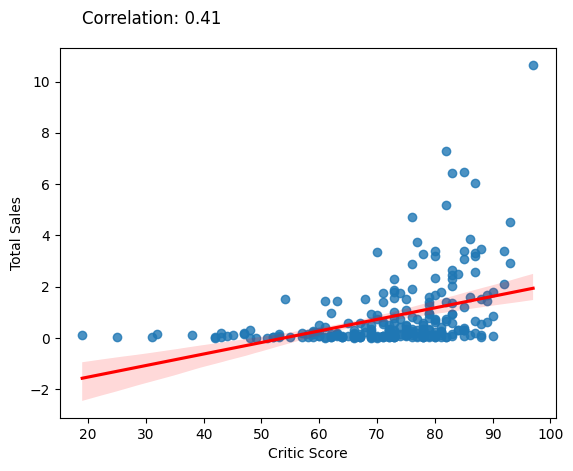

In [65]:
PS4 = df.query("platform == 'PS4'")

sns.regplot(x='critic_score', y='total_sales', data=PS4, line_kws={'color': 'red'})
plt.xlabel('Critic Score')
plt.ylabel('Total Sales')
corr = PS4['critic_score'].corr(PS4['total_sales'])
plt.text(PS4['critic_score'].min(), PS4['total_sales'].max(), f"Correlation: {corr:.2f}", fontsize=12)
plt.show()

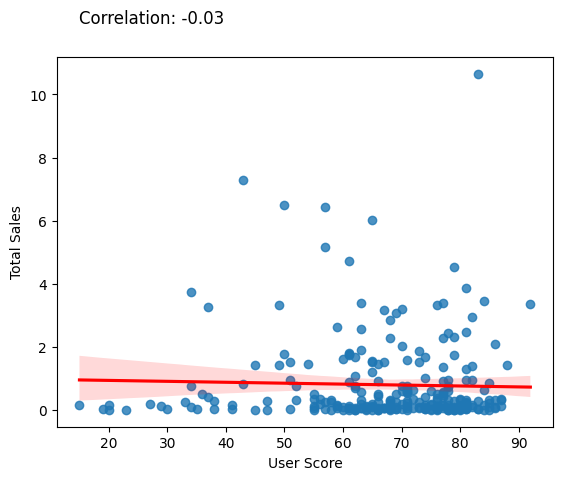

In [66]:
sns.regplot(x='user_score', y='total_sales', data=PS4, line_kws={'color': 'red'})
plt.xlabel('User Score')
plt.ylabel('Total Sales')
corr = PS4['user_score'].corr(PS4['total_sales'])
plt.text(PS4['user_score'].min(), PS4['total_sales'].max(), f"Correlation: {corr:.2f}", fontsize=12)
plt.show()

## Creating regional user profile
For each region (NA, EU, JP), determine:
- The top five platforms. Describe variations in their market shares from region to region.
- The top five genres. Explain the difference.
- Do ESRB ratings affect sales in individual regions?

Observations:
- Japanese gamers are different in their genre preferences. While other regions the same order for  top genres, RPGs rank highest in Japan and sports are less popular 

In [67]:
top_platforms

['PS2', 'X360', 'Wii', 'PS3', 'DS', 'PS']

In [68]:
table.head()

,platform,min,max,count,na_sales,eu_sales,jp_sales,total_sales,avg_sales,lifecycle
0,PS2,2000.0,2011.0,2127,583.84,339.29,139.20,1062.33,0.499450,11.0
1,X360,2005.0,2016.0,1232,602.47,270.76,12.43,885.66,0.718880,11.0
2,PS3,2006.0,2016.0,1306,393.49,330.29,80.19,803.97,0.615597,10.0
3,Wii,2006.0,2016.0,1285,455.54,233.25,65.56,754.35,0.587043,10.0
4,DS,2004.0,2013.0,2121,382.40,188.89,175.57,746.86,0.352126,9.0


In [69]:
# Create a market share table 
top_annual = top_df.groupby(['year_of_release','platform'])[['na_sales','eu_sales','jp_sales','total_sales']].sum().reset_index()
top_annual_totals = top_annual.join(annual_totals, on='year_of_release', how='left', rsuffix='_total')
top_annual_totals['na_share'] = top_annual_totals['na_sales'] / top_annual_totals['na_sales_total']
top_annual_totals['eu_share'] = top_annual_totals['eu_sales'] / top_annual_totals['eu_sales_total']
top_annual_totals['jp_share'] = top_annual_totals['jp_sales'] / top_annual_totals['jp_sales_total']
top_annual_totals['total_share'] = top_annual_totals['total_sales'] / top_annual_totals['total_sales_total']

top_annual_shares = top_annual_totals[['year_of_release','platform','na_share','eu_share','jp_share','total_share']]
top_annual_shares

,year_of_release,platform,na_share,eu_share,jp_share,total_share
0,1994.0,PS,0.062500,0.080645,0.078553,0.073088
1,1995.0,PS,0.588401,0.661074,0.208525,0.397754
2,1996.0,PS,0.523513,0.548455,0.310237,0.465685
3,1997.0,PS,0.612770,0.768626,0.677307,0.668438
4,1998.0,PS,0.648333,0.728550,0.569145,0.654056
...,...,...,...,...,...,...
61,2015.0,Wii,0.004024,0.006410,0.000000,0.004418
62,2015.0,X360,0.068875,0.036187,0.000000,0.045694
63,2016.0,PS3,0.014912,0.024600,0.067323,0.027975
64,2016.0,Wii,0.001335,0.002148,0.000000,0.001472


C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1453439249.py:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



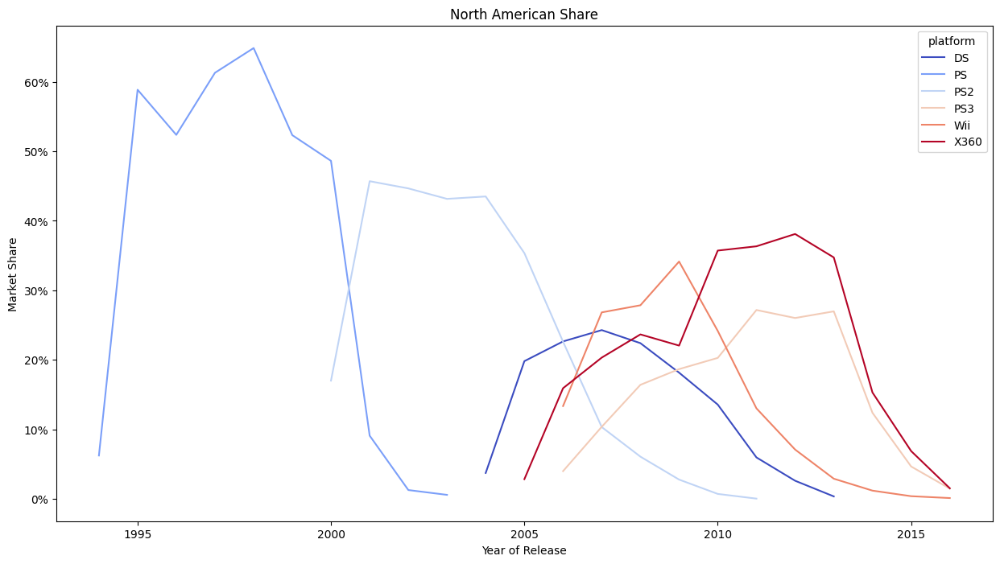

C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1453439249.py:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



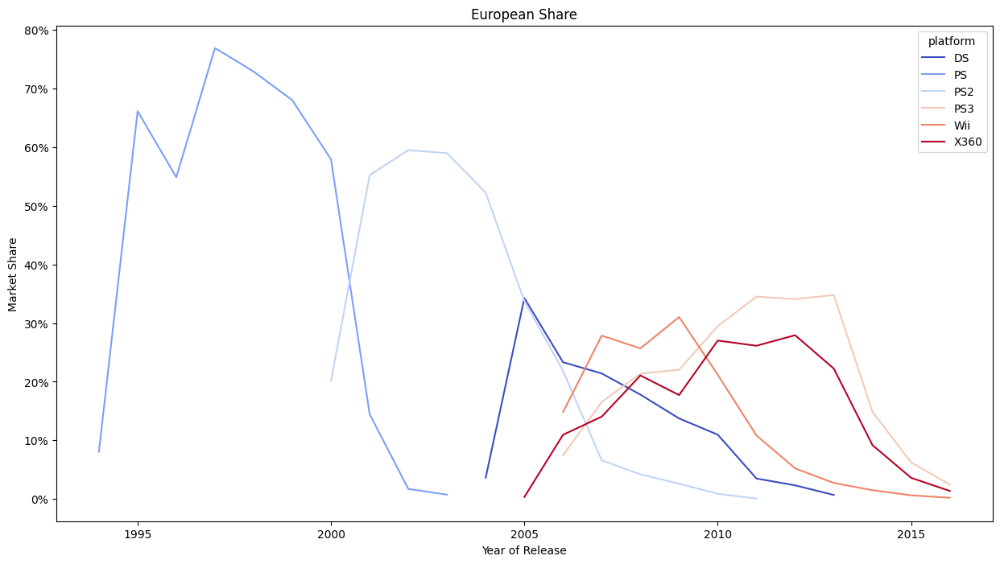

C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1453439249.py:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



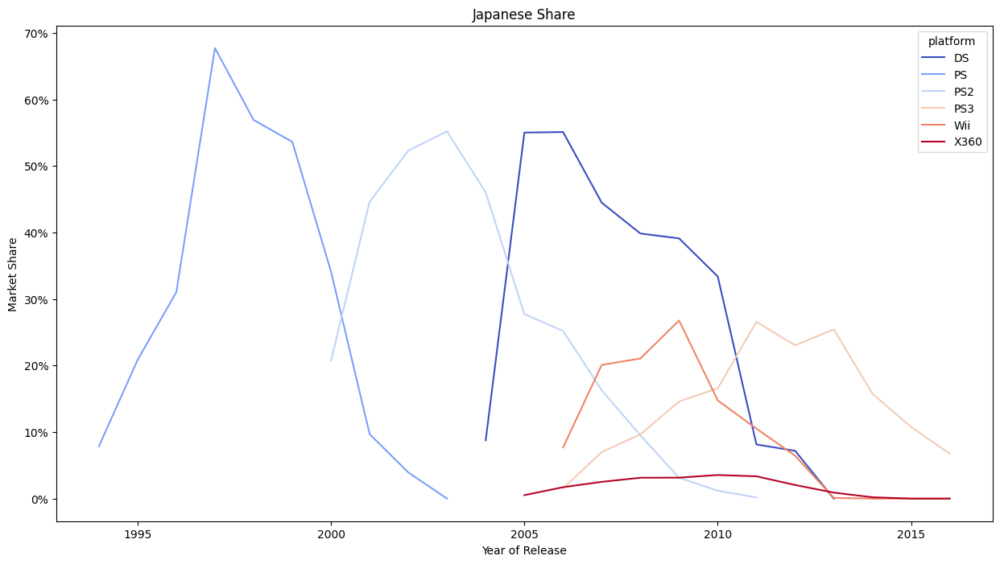

C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1453439249.py:17: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



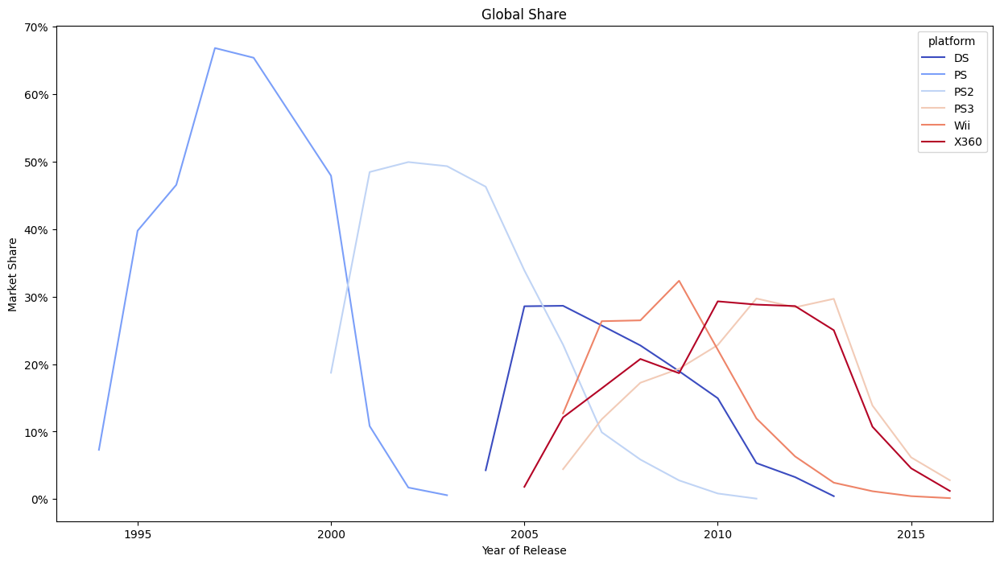

In [70]:
# Share of total sales - comparing platforms across time within each region 
regions = ['na_share', 'eu_share', 'jp_share', 'total_share']
region_dict = {
    'na_share': 'North American Share', 
    'eu_share': 'European Share', 
    'jp_share': 'Japanese Share', 
    'total_share': 'Global Share'
}

for region in regions: 
    pivot_shares = top_annual_shares.pivot(index='year_of_release', columns='platform', values=region)
    ax = pivot_shares.plot(kind='line', 
                           stacked=False, 
                           figsize=(15,8),
#                            width=3,
#                            alpha=0.5,
                           color=plt.cm.get_cmap('coolwarm')(np.linspace(0, 1, len(pivot_shares.columns))),
                           xlabel='Year of Release',
                           ylabel='Market Share',
                           title='{}'.format(region_dict[region])
                          )
    
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
#     ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('{:.0f}'))
    plt.show()

In [71]:
# I want a graph that shows each platform in top_platforms and a its share in each region 
# To do this I need to switch market shares and platforms in top_annual_shares (platforms across the top, region as a category)

melted_shares = top_annual_shares.melt(id_vars=['year_of_release', 'platform'], 
                                       value_vars=['na_share', 'eu_share', 'jp_share', 'total_share'], 
                                       var_name='region', 
                                       value_name='share'
                                      )

platform_shares = melted_shares.set_index(['year_of_release', 'region', 'platform'])

platform_unstacked = platform_shares.unstack(level='platform')
platform_unstacked = platform_unstacked.reset_index()
platform_unstacked.droplevel(1, axis=1)
platform_unstacked.columns = ['year_of_release', 'region', 'DS', 'PS', 'PS2', 'PS3', 'Wii', 'X360']
platform_unstacked

,year_of_release,region,DS,PS,PS2,PS3,Wii,X360
0,1994.0,eu_share,NaN,0.080645,NaN,NaN,NaN,NaN
1,1994.0,jp_share,NaN,0.078553,NaN,NaN,NaN,NaN
2,1994.0,na_share,NaN,0.062500,NaN,NaN,NaN,NaN
3,1994.0,total_share,NaN,0.073088,NaN,NaN,NaN,NaN
4,1995.0,eu_share,NaN,0.661074,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
87,2015.0,total_share,NaN,NaN,NaN,0.061850,0.004418,0.045694
88,2016.0,eu_share,NaN,NaN,NaN,0.024600,0.002148,0.013862
89,2016.0,jp_share,NaN,NaN,NaN,0.067323,0.000000,0.000000
90,2016.0,na_share,NaN,NaN,NaN,0.014912,0.001335,0.015357


In [72]:
platform_unstacked.pivot(index=['year_of_release'], columns='region', values='Wii')

region,eu_share,jp_share,na_share,total_share
year_of_release,,,,
1994.0,NaN,NaN,NaN,NaN
1995.0,NaN,NaN,NaN,NaN
1996.0,NaN,NaN,NaN,NaN
1997.0,NaN,NaN,NaN,NaN
1998.0,NaN,NaN,NaN,NaN
1999.0,NaN,NaN,NaN,NaN
2000.0,NaN,NaN,NaN,NaN
2001.0,NaN,NaN,NaN,NaN
2002.0,NaN,NaN,NaN,NaN


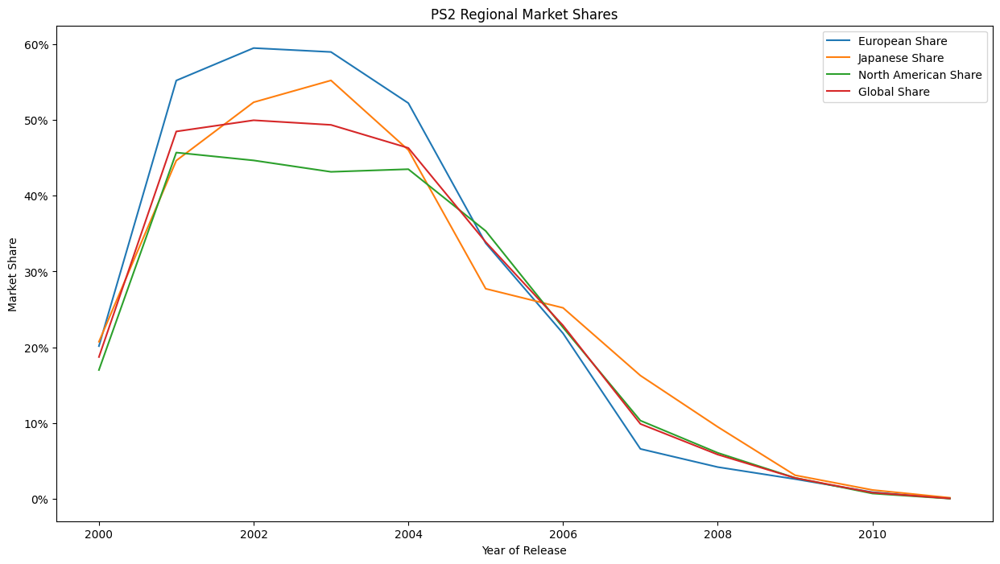

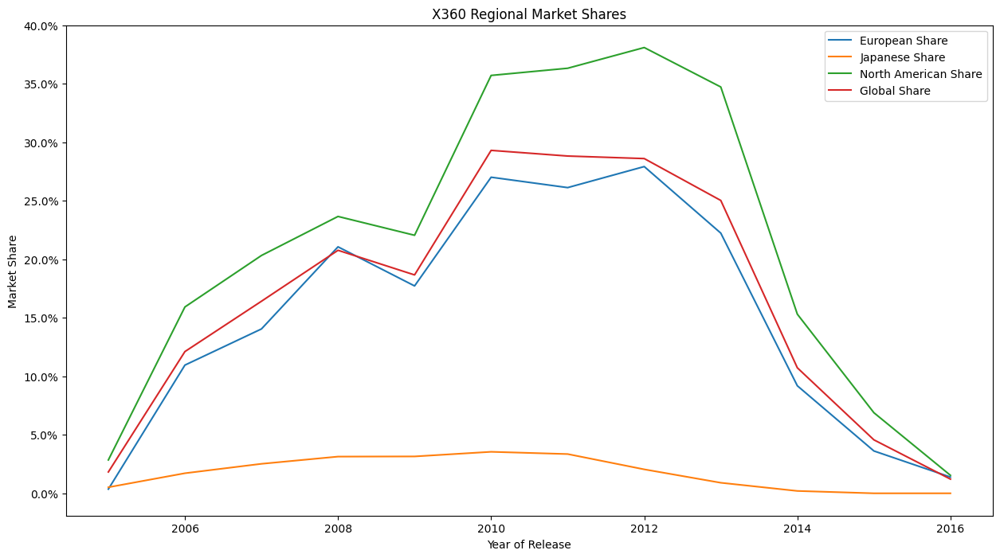

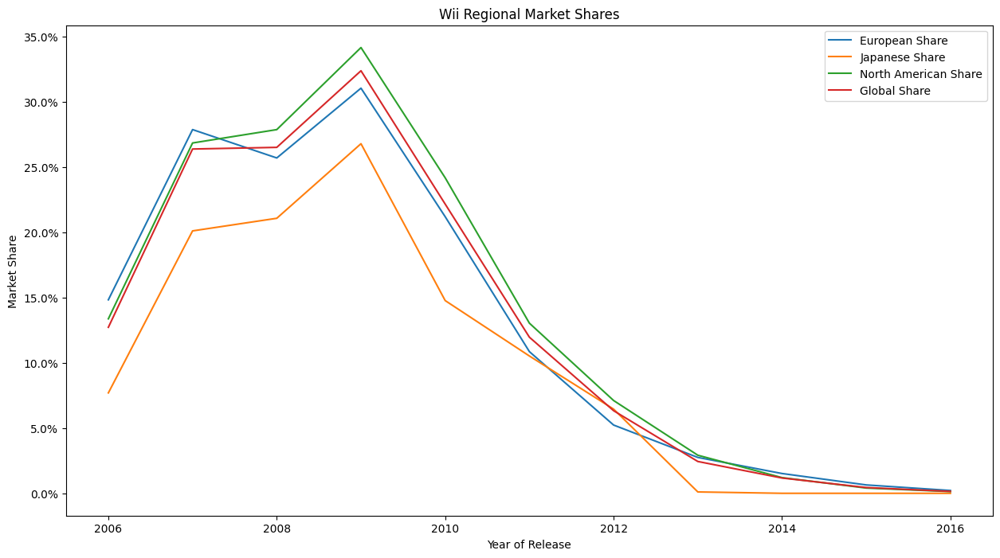

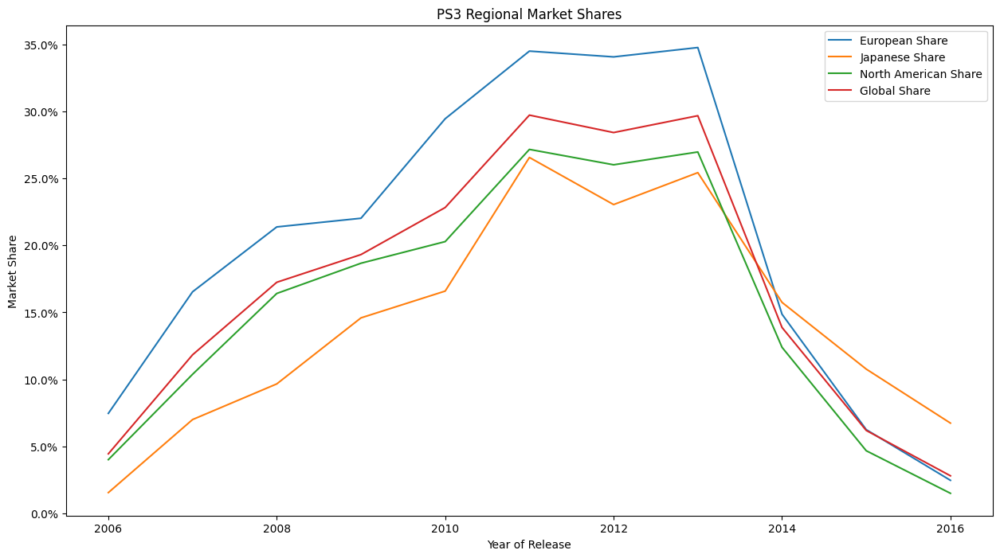

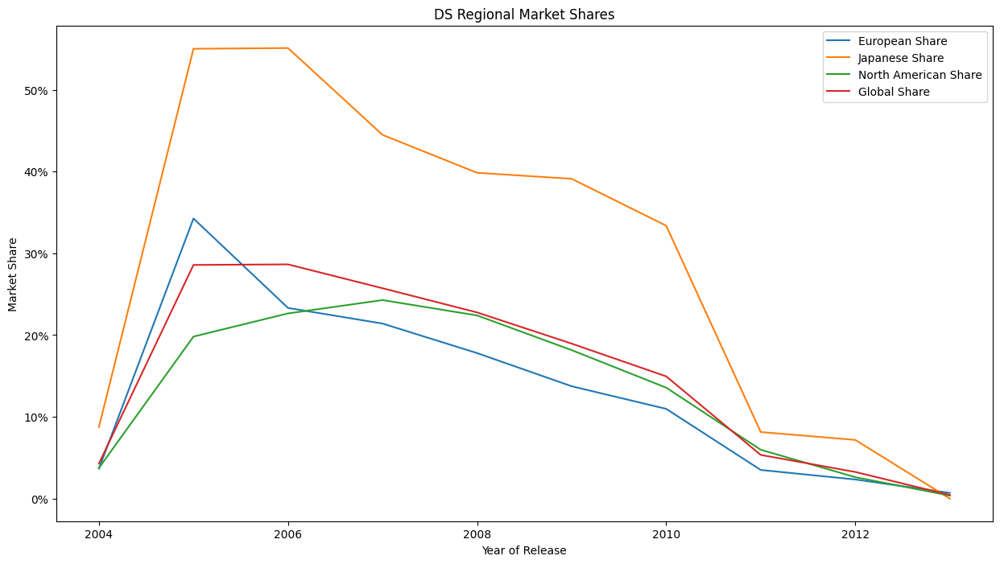

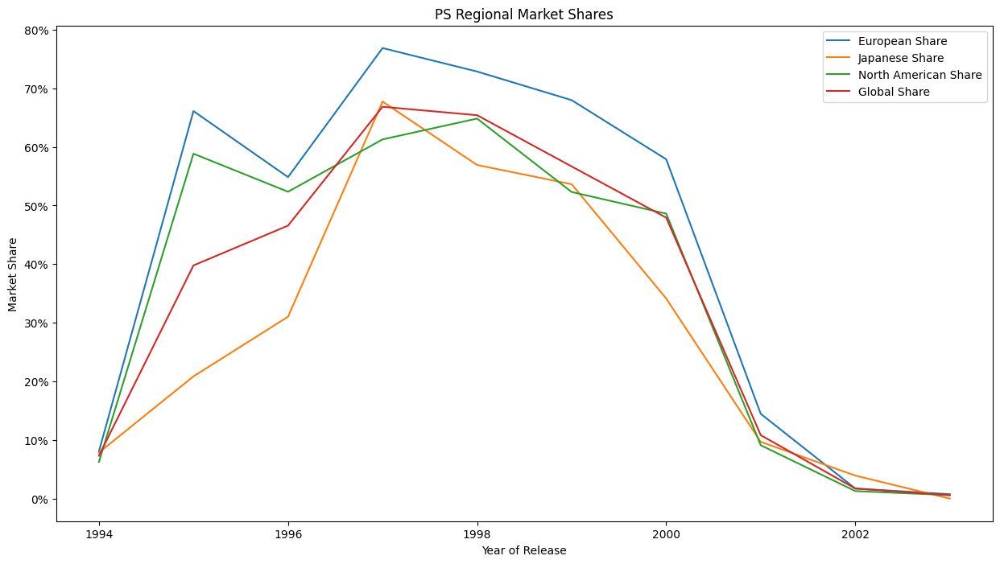

In [73]:
# Share of total sales - comparing regions for the same platform 

for platform in top_platforms: 
    pivot_shares = platform_unstacked.pivot(index='year_of_release', columns='region', values=platform)
    ax = pivot_shares.plot(kind='line', 
                           figsize=(15,8),
                           xlabel='Year of Release',
                           ylabel='Market Share',
                           title='{} Regional Market Shares'.format(platform)
                          )
    
    # extract the handles from the plotted lines
    handles, _ = ax.get_legend_handles_labels()
    
    # create a custom legend using the handles and region_dict
    plt.legend(handles=handles, labels=[region_dict[h.get_label()] for h in handles])
    
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    plt.show()
    
    
# Observations:
#     The Japanese market has unique characteristics, XB360 did not do well but Nintendo and PS consoles do a lot better, naturally since they are Japanese consoles
#     Given the console difference plus the genre difference, perhaps we segment the market Japan / RoW (mostly NA/EU western markets)

**Looking at Top Genres in each Region**

In [74]:
top_genres = post_2000_df.groupby('genre')[['na_sales','eu_sales','jp_sales','total_sales']].sum().sort_values(by='total_sales',ascending=False)

na_top5 = top_genres.nlargest(5, 'na_sales')['na_sales'].index.tolist()
eu_top5 = top_genres.nlargest(5, 'eu_sales')['eu_sales'].index.tolist()
jp_top5 = top_genres.nlargest(5, 'jp_sales')['jp_sales'].index.tolist()
total_top5 = top_genres.nlargest(5, 'total_sales')['total_sales'].index.tolist()

print('NA Top: ', na_top5)
print('EU Top: ', eu_top5)
print('JP Top: ', jp_top5) # Japan is the unique case, where RPGs are the top and sports are not as popular, relatively 
print('Total Top: ', total_top5)

top_genres

NA Top:  ['Action', 'Sports', 'Shooter', 'Misc', 'Racing']
EU Top:  ['Action', 'Sports', 'Shooter', 'Misc', 'Racing']
JP Top:  ['Role-Playing', 'Action', 'Misc', 'Sports', 'Platform']
Total Top:  ['Action', 'Sports', 'Shooter', 'Misc', 'Role-Playing']


,na_sales,eu_sales,jp_sales,total_sales
genre,,,,
Action,732.89,440.14,130.21,1303.24
Sports,535.80,295.94,67.99,899.73
Shooter,481.53,272.99,23.06,777.58
Misc,363.70,192.36,83.75,639.81
Role-Playing,259.25,128.47,222.52,610.24
Racing,264.89,185.20,27.05,477.14
Platform,248.89,135.05,52.64,436.58
Fighting,155.68,70.37,42.54,268.59
Simulation,147.47,78.74,39.71,265.92


In [75]:
genre_rankings = post_2000_df.groupby(['year_of_release','genre'])[['na_sales','eu_sales','jp_sales','total_sales']].sum().reset_index()
genre_rankings

,year_of_release,genre,na_sales,eu_sales,jp_sales,total_sales
0,2000.0,Action,0.86,0.68,1.63,3.17
1,2000.0,Adventure,0.00,0.00,0.15,0.15
2,2000.0,Fighting,2.91,2.48,1.84,7.23
3,2000.0,Misc,0.02,0.02,0.00,0.04
4,2000.0,Platform,0.19,0.14,0.00,0.33
...,...,...,...,...,...,...
199,2016.0,Role-Playing,5.76,4.01,6.61,16.38
200,2016.0,Shooter,15.47,14.92,1.06,31.45
201,2016.0,Simulation,0.11,0.42,0.33,0.86
202,2016.0,Sports,7.53,11.80,0.92,20.25


C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1165251752.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



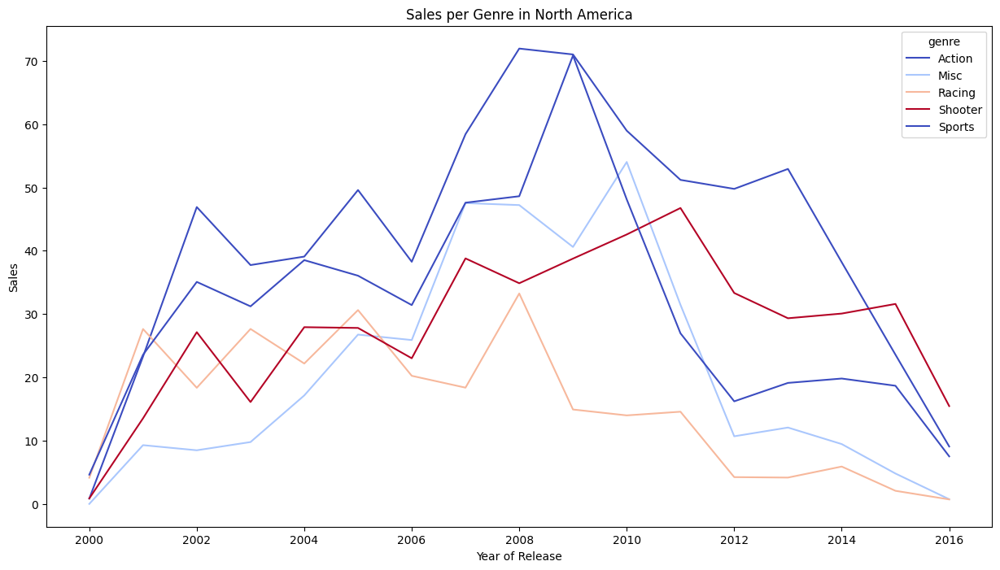

C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1165251752.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



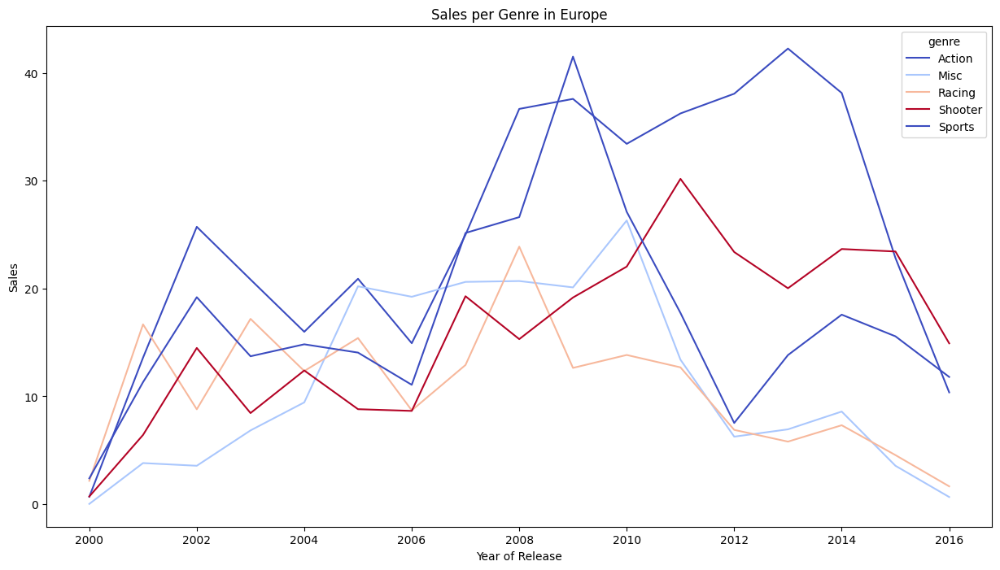

C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1165251752.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



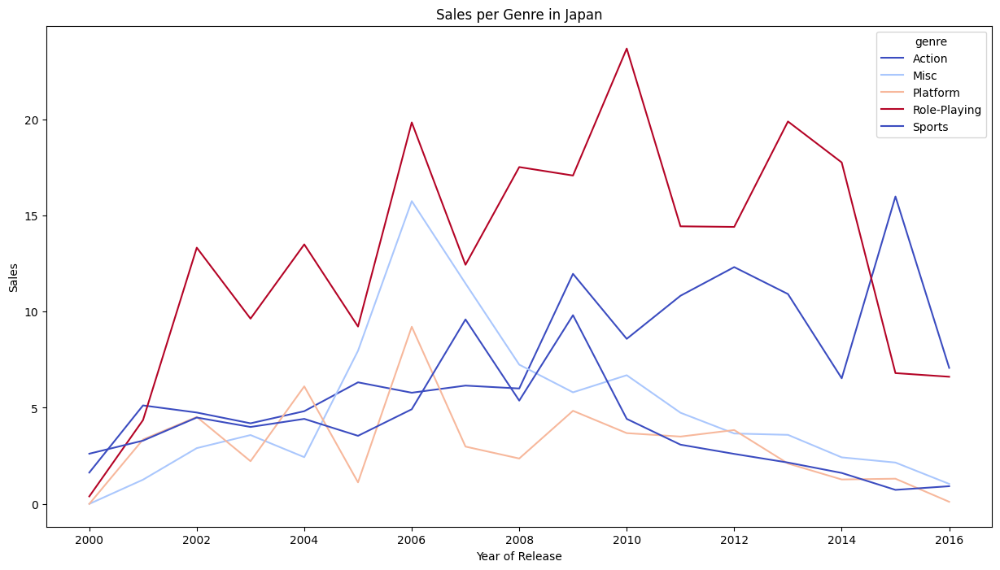

C:\Users\melvi\AppData\Local\Temp\ipykernel_24172\1165251752.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



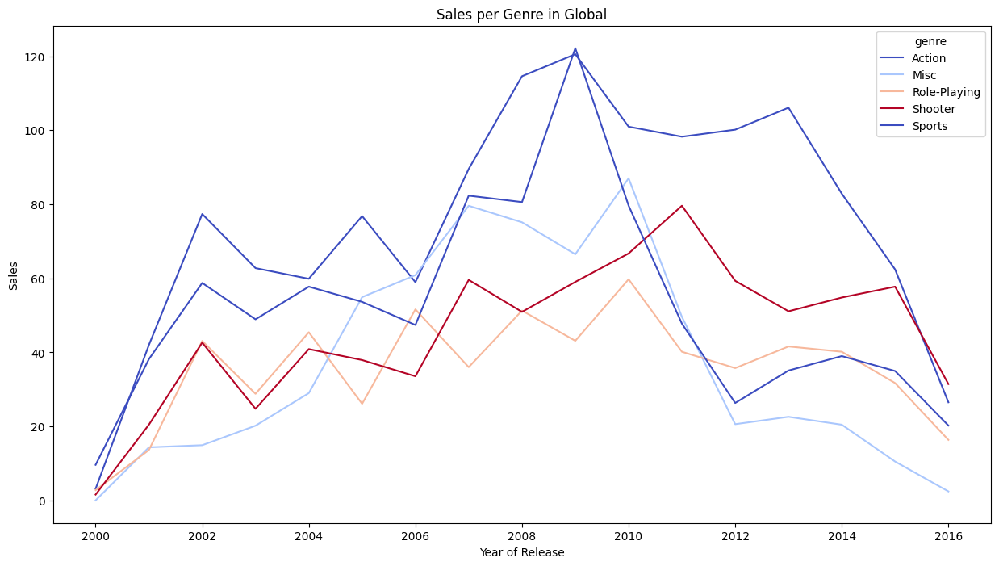

In [76]:
# Looking at the top 5 genres in each region

regions = ['na_sales', 'eu_sales', 'jp_sales', 'total_sales']

region_dict = {
    'na_sales':'North America',
    'eu_sales':'Europe',
    'jp_sales':'Japan',
    'total_sales':'Global'
}

genre_dict = {
    'na_sales':na_top5,
    'eu_sales':eu_top5,
    'jp_sales':jp_top5,
    'total_sales':total_top5
}

for region in regions:
    pivot_genre = genre_rankings.query('genre in {}'.format(genre_dict[region])).pivot(index='year_of_release', columns='genre', values=region)
    pivot_genre.plot(kind='line',
                     figsize=(15,8),
                     color=plt.cm.get_cmap('coolwarm')(np.linspace(0, 1, len(pivot_shares.columns))),
                     xlabel='Year of Release',
                     ylabel='Sales',
                     title='Sales per Genre in {}'.format(region_dict[region])
                    )
    
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
#     ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('{:.0f}'))
    plt.show()

## Hypothesis testing
- Average user ratings of the Xbox One and PC platforms are the same.
- Average user ratings for the Action and Sports genres are different.
    - Set the alpha threshold value yourself.
- Explain:
    - How you formulated the null and alternative hypotheses
    - What significance level you chose to test the hypotheses, and why

In [77]:
PC_user_scores = df.query('platform == "PC"')['user_score'].tolist()
XB_user_scores = df.query('platform == "XB"')['user_score'].tolist()

In [78]:
print('PC Scores: ', len(PC_user_scores))
print('XB Scores: ', len(XB_user_scores))

PC Scores:  974
XB Scores:  824


In [79]:
# Lists need to have same length
st.ttest_ind(PC_user_scores, XB_user_scores, equal_var=True)

Ttest_indResult(statistic=nan, pvalue=nan)

## Conclusion

In [80]:
# Format: Complete the task in the Jupyter Notebook. Insert the programming code in the code cells and text explanations in the markdown cells. Apply formatting and add headings.